```python
file1 \_ |-----------------------------------|   -+-
file2 \_ |-----------------------------------|    |   training data
file3 \_ |-----------------------------------|    |        80%
file4 \_ |-----------------------------------|    |
                                                 -+-
file5 \_ |-----------------------------------|    |  validation data
file6 \_ |-----------------------------------|    |        20%
         |-----------------------------------|   -+-
```

In [1]:
import os
import glob

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

from utils.MovingAverager import *

# 讀檔

In [2]:
def rename_data(df):
    new_names = ['system_time', 'acc_times', 'acc_x', 'acc_y', 'acc_z', 'gyo_times', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_times', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_times', 'mag_x', 'mag_y', 'mag_z']
    df.columns = new_names
    
    return df


def device_start_system_time(path):
    time_df = pd.read_csv(path, delimiter=';', index_col=0)
    time = time_df.T.loc['system time', 'START']
    
    return time


def gen_total_mag(df: pd.DataFrame):
    df['mag_x'] = moving_average(df['mag_x'], 11)
    df['mag_y'] = moving_average(df['mag_y'], 11)
    df['mag_z'] = moving_average(df['mag_z'], 11)
    
    df['mag_t'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2) + (df['mag_z'] ** 2))
    
    return df


def calculate_angle(df):
    df['acc_x'] = moving_average(df['acc_x'], 11)
    df['acc_y'] = moving_average(df['acc_y'], 11)
    df['acc_z'] = moving_average(df['acc_z'], 11)

    df['lin_acc_x'] = moving_average(df['lin_acc_x'], 11)
    df['lin_acc_y'] = moving_average(df['lin_acc_y'], 11)
    df['lin_acc_z'] = moving_average(df['lin_acc_z'], 11)
    
    df['acc_t'] = np.sqrt((df['acc_x'] ** 2) + (df['acc_y'] ** 2) + (df['acc_z'] ** 2))
    df[['gacc_x', 'gacc_y', 'gacc_z']] = df[['acc_x', 'acc_y', 'acc_z']].to_numpy() - df[['lin_acc_x', 'lin_acc_y', 'lin_acc_z']].to_numpy()
    df['gacc_t'] = np.sqrt((df['gacc_x'] ** 2) + (df['gacc_y'] ** 2) + (df['gacc_z'] ** 2))

    acc_xyz = df[['acc_x', 'acc_y', 'acc_z']].to_numpy()
    acc_t = df['acc_t'].to_numpy()
    gacc_t = df['gacc_t'].to_numpy()
    gacc_xyz = np.concatenate((np.zeros((len(df), 2)), gacc_t[:, None]), axis=-1)

    df['angle'] = np.arccos((np.sum(acc_xyz * gacc_xyz, axis=-1)) / (acc_t *  gacc_t)) / np.pi * 180
    
    return df


def load_original_data(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=';')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=';')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=';')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=';')
    start_time = device_start_system_time(os.path.join(path, 'meta/time.csv'))
    time_df = acc_df.iloc[:, 0] + start_time
    
    total_df = pd.concat([time_df, acc_df, gyo_df, linacc_df, mag_df], axis=1)
    total_df = total_df[:-5]  # remove last None value row
    total_df = rename_data(total_df)
    total_df = gen_total_mag(total_df)
    total_df = calculate_angle(total_df)
    
    return total_df

In [3]:
def align_data(source_df, target_df):
    source_start_time = source_df.loc[0, 'system_time']
    target_start_time = target_df.loc[0, 'system_time']
    
    # align start time
    if source_start_time > target_start_time:  # source start time > target start time
        target_start_idx = np.argmin(np.abs(target_df.system_time - source_start_time))
        target_df = target_df.iloc[target_start_idx:].reset_index(drop=True)
    else:  # source start time < target start time
        source_start_idx = np.argmin(np.abs(source_df.system_time - target_start_time))
        source_df = source_df.iloc[source_start_idx:].reset_index(drop=True)
        
    # align end idx
    end_idx = min(len(source_df), len(target_df))
    source_df = source_df.iloc[:end_idx]
    target_df = target_df.iloc[:end_idx]
    
    return source_df, target_df


def bound_range(df):
    start = datapoint_per_second * 35
    end = len(df) - datapoint_per_second * 20
    
    return df.iloc[start:end].reset_index(drop=True)


def split_segments(df, seq_len=25):
    num_of_segs = int(np.floor(len(df) / seq_len))
    
    segments = []
    for i in range(num_of_segs):
        seg = df.iloc[int(i * seq_len):int((i + 1) * seq_len)].to_numpy()
        segments.append(seg)
        
    return segments


def split_segments_overlap(df, seq_len=25, shift=15):
    
    segments = []
    for i in range(0, len(df) - seq_len, shift):
        seg = df.iloc[i:i + seq_len].to_numpy()
        segments.append(seg)
        
    return segments


def select_data(df):
    return df[['lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'gyo_x', 'gyo_y', 'gyo_z', 'angle', 'mag_x', 'mag_y', 'mag_z', 'mag_t', 'system_time']]


def preprocess_data(df, seq_len=25, shift=15, is_train_data=False):
    pre_df = select_data(df)
    
    if is_train_data:
        segs = split_segments_overlap(pre_df, seq_len, shift)
    else:
        segs = split_segments(pre_df, seq_len)
    
    return segs

In [4]:
def device_version(path):
    device_df = pd.read_csv(path, delimiter=';', index_col=0)
    version = device_df.loc['deviceRelease'].value
    
    return version


def check_data_device(source_path, target_path):
    while True:
        source_version = device_version(os.path.join(source_path, 'meta/device.csv'))
        target_version = device_version(os.path.join(target_path, 'meta/device.csv'))

#         print(source_path, target_path)

        if source_version[:2] == '15' and target_version[:2] == '16':
            return source_path, target_path
        elif source_version[:2] == '16' and target_version[:2] == '15':
            source_path = os.path.join(folder_path, 'target')
            target_path = os.path.join(folder_path, 'source')
            print('--- GG ---')
            continue
        else:
            raise


def load_pair_data(root_folder, class_num, file_index=None, is_train_data=False):
    prefix = 'train' if is_train_data else 'valid'
    pair_data = []
    folder_paths = glob.glob(f'*{os.path.normpath(root_folder)}/*')

    if file_index is not None:
        folder_paths = folder_paths[file_index[0]:file_index[1]]

    for i, folder_path in enumerate(folder_paths):
        source_path = os.path.join(folder_path, 'source')
        target_path = os.path.join(folder_path, 'target')
        
        print(f'{prefix} {i + 1: >3}: {folder_path}')
        
        #########################
        ##### check devices #####
        #########################
        source_path, target_path = check_data_device(source_path, target_path)
        
        ####################################
        ##### load and preprocess data #####
        ####################################
        source_df = load_original_data(source_path)
        target_df = load_original_data(target_path)
        
#         print(source_df.system_time[0], target_df.system_time[0])
        
        source_df, target_df = bound_range(source_df), bound_range(target_df)
        source_df, target_df = align_data(source_df, target_df)

        source_segs = preprocess_data(source_df, seq_len, shift, is_train_data)
        target_segs = preprocess_data(target_df, seq_len, shift, is_train_data)
        
        idx = min(len(source_segs), len(target_segs))
        source_tags = [class_num] * idx
        target_tags = [0] * idx
        
        pair_data.extend(zip(source_segs[:idx], source_tags, target_segs[:idx], target_tags))
        
    return pair_data

In [5]:
datapoint_per_second = 20
duration = 2
seq_len = 25
shift = 15  # the shfit of the data
classes = {0: 'target', 1: 'front_pocket', 2: 'pocket', 3: 'swing'}

In [6]:
source_device_version = device_version('./front_pocket/202302071523/source/meta/device.csv')
target_device_version = device_version('./front_pocket/202302071523/target/meta/device.csv')
print(f"source device version: {source_device_version}")  # source version: 15.4
print(f"target device version: {target_device_version}")  # target version: 16.3

source device version: 15.4
target device version: 16.3


In [7]:
train_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[0, 8], is_train_data=True)
valid_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[8, 10], is_train_data=False)

train_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[0, 8], is_train_data=True)
valid_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[8, 10], is_train_data=False)

train_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[0, 8], is_train_data=True)
valid_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[8, 10], is_train_data=False)

train   1: front_pocket/202302071628
train   2: front_pocket/202302071652
train   3: front_pocket/202302071523
train   4: front_pocket/202302071531
train   5: front_pocket/202302071715
train   6: front_pocket/202302071641
train   7: front_pocket/202302071541
train   8: front_pocket/202302071619
valid   1: front_pocket/202302071704
valid   2: front_pocket/202302071724
train   1: pocket/202302132108
train   2: pocket/202302131750
train   3: pocket/202302131601
train   4: pocket/202302071606
train   5: pocket/202302132053
train   6: pocket/202302122132
train   7: pocket/202302132116
train   8: pocket/202302131643
valid   1: pocket/202301101952
valid   2: pocket/202302132101
train   1: swing/202302142339
train   2: swing/202302132131
train   3: swing/202302142117
train   4: swing/202302132124
train   5: swing/202302121947
train   6: swing/202302121857
train   7: swing/202302142128
train   8: swing/202302121920
valid   1: swing/202302121909
valid   2: swing/202302142331


In [8]:
print(len(train_front_pocket_pair_data), len(train_pocket_pair_data), len(train_swing_pair_data))

3070 3003 2900


In [9]:
train_front_pocket_pair_data[0][0][0], train_front_pocket_pair_data[0][2][0]

(array([-3.50329294e-01,  1.51894025e-01,  2.26504005e-01, -2.18800381e-01,
        -2.56263137e-01, -2.19771296e-01,  8.89969956e+01,  1.90718285e+01,
        -1.88885755e+01,  3.45052268e+01,  4.37163997e+01,  1.67575811e+09]),
 array([-1.29992731e-01, -1.10354979e-01,  1.42364870e-01, -5.08982837e-02,
        -8.86559859e-02,  1.07779831e-01,  5.22143092e+01, -3.91503539e+01,
        -8.05056971e+00, -2.00937084e+01,  4.47361040e+01,  1.67575811e+09]))

# 建立dataloader

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

In [11]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx]

In [12]:
class FirstDerivativeLoss(nn.Module):
    def __init__(self, weight=None, size_average=None, reduce=None, reduction='mean'):
        super(FirstDerivativeLoss, self).__init__()

    def forward(self, source, target):
        # calculate the first derivative
        source_o = torch.reshape(source, (len(source), -1))
        target_o = torch.reshape(target, (len(target), -1))
        d_source = source_o[1:] - source_o[:-1]
        d_target = target_o[1:] - target_o[:-1]
        deriv = d_source - d_target

        # calculate the loss as the mean squared error of the derivative
        loss = torch.mean(torch.pow(deriv, 2))

        return loss

In [13]:
def generator_loss(z_imu, target_imu, predict_mag, target_mag, source_total_mag, target_total_mag):
    imu_loss = mse_loss(z_imu, target_imu)
    mag_loss = mse_loss(predict_mag, target_mag)
    d1_loss = div_loss(predict_mag, target_mag)
    
    pred_total_mag = torch.sqrt(torch.sum(torch.pow(predict_mag, 2), dim=-1))
    
#     print(source_total_mag.shape, target_total_mag.shape, pred_total_mag.shape)
#     print(source_total_mag[0])
#     print(target_total_mag[0])
#     print(pred_total_mag[0])
    
    smag_limitation_loss = torch.mean(torch.abs(pred_total_mag - source_total_mag))
    tmag_limitation_loss = torch.mean(torch.abs(pred_total_mag - target_total_mag))

    total_loss = imu_loss + mag_loss + d1_loss + smag_limitation_loss * 0.25 + tmag_limitation_loss * 0.75
    return total_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss)

# def discriminator_loss(d_real, d_fake):
#     real_loss = bce_loss(d_real, torch.ones_like(d_real))
#     fake_loss = bce_loss(d_fake, torch.zeros_like(d_fake))

#     return real_loss + fake_loss

In [14]:
train_data = train_front_pocket_pair_data + train_pocket_pair_data + train_swing_pair_data
valid_data = valid_front_pocket_pair_data + valid_pocket_pair_data + valid_swing_pair_data

# train
train_source_data = np.array([d[0] for d in train_data])
train_source_label = np.array([d[1] for d in train_data])
train_target_data = np.array([d[2] for d in train_data])
train_target_label = np.array([d[3] for d in train_data])
train_dataset = PairDataset(
                    source_data = torch.tensor(train_source_data, dtype=torch.float),
                    source_label = train_source_label,
                    target_data = torch.tensor(train_target_data, dtype=torch.float),
                    target_label = train_target_label,
                )
train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True)

# valid
valid_source_data = np.array([d[0] for d in valid_data])
valid_source_label = np.array([d[1] for d in valid_data])
valid_target_data = np.array([d[2] for d in valid_data])
valid_target_label = np.array([d[3] for d in valid_data])
valid_dataset = PairDataset(
                    source_data = torch.tensor(valid_source_data, dtype=torch.float),
                    source_label = valid_source_label,
                    target_data = torch.tensor(valid_target_data, dtype=torch.float),
                    target_label = valid_target_label,
                )
valid_loader = DataLoader(valid_dataset, batch_size=512)

In [15]:
batch = next(iter(train_loader))

In [16]:
EPOCH = 6000
num_of_classes = 4
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
ce_loss = torch.nn.CrossEntropyLoss()
mse_loss = torch.nn.MSELoss()
bce_loss = torch.nn.BCELoss()
div_loss = FirstDerivativeLoss()

In [17]:
def get_tgt_mask(size) -> torch.tensor:
    # Generates a squeare matrix where the each row allows one word more to be seen
    mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
    mask = mask.float()
    mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
    mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0

    # EX for size=5:
    # [[0., -inf, -inf, -inf, -inf],
    #  [0.,   0., -inf, -inf, -inf],
    #  [0.,   0.,   0., -inf, -inf],
    #  [0.,   0.,   0.,   0., -inf],
    #  [0.,   0.,   0.,   0.,   0.]]

    return mask

In [18]:
class Classifier(nn.Module):
    def __init__(self, seq_len=21, num_of_classes=2):
        super(Classifier, self).__init__()
        
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.nn = nn.Sequential(
            nn.Linear(6, 16),
            nn.SELU(),
            nn.Linear(16, 16),
            nn.SELU(),
        )
        
        # 16 * (seq_len-8)
        self.rnn = nn.RNN(input_size=16, hidden_size=32, num_layers=2, batch_first=True, bidirectional=True)
        
        self.last = nn.Sequential(
            nn.Linear(64 * self.seq_len, 16),
            nn.Tanh(),
            nn.Linear(16, num_of_classes),
        )
        
    def forward(self, x):  # input: (bs, seq_len, 6)
        h = self.nn(x)

        hz, _ = self.rnn(h)
        
        hz = hz.reshape(len(x), -1)
        out = self.last(hz)

        out = torch.reshape(out, (len(x), self.num_of_classes))
        
        return out, hz
    
    def predict_label(self, x):
        predict_probability, _ = self(x)
        predict_probability = predict_probability.reshape((-1, self.num_of_classes))
        _, predict_classes = torch.max(predict_probability, 1)
        one_hot = F.one_hot(predict_classes, num_classes=self.num_of_classes).to(device).float()
        class_result = one_hot.reshape(-1, self.num_of_classes)
        
        return class_result

In [19]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :].to(x.device)
        return self.dropout(x)
    

class NotSimpleTransformer(nn.Module):
    def __init__(self, seq_len=21, num_of_classes=2):
        super(NotSimpleTransformer, self).__init__()
        
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.imu_layer = nn.Sequential(
            nn.Linear(6, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 64),
            nn.LeakyReLU(),
        )
        self.mag_layer = nn.Sequential(
            nn.Linear(3, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 64),
            nn.LeakyReLU(),
        )
        self.pos_encoder = PositionalEncoding(64, 0.1)
        
        self.encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        self.nn = nn.Sequential(
            nn.Linear(64, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 6),
            nn.LeakyReLU(),
        )
        
        self.task_controller = nn.Sequential(
            nn.Linear(68, 64),
            nn.LeakyReLU(),
            nn.Linear(64, 32),
            nn.LeakyReLU(), 
            nn.Linear(32, 9),
            nn.LeakyReLU(),
        )
        
        self.decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        
        self.mag_last = nn.Sequential(
            nn.Linear(64, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 3),
        )
        
    def forward(self, source_imu, source_mag, source_class):
        
        ### step 1
        h_imu = self.imu_layer(source_imu)
        h_imu = self.pos_encoder(h_imu)
        
        h_mag = self.mag_layer(source_mag)
        h_mag = self.pos_encoder(h_mag)
        
        ### step 2
        z = self.encoder(h_imu)
        z_imu = self.nn(z)
        
        ### step 3
        z_gap = torch.mean(z, dim=1)
        task_latent = torch.concat([z_gap, source_class], dim=-1)
        task_latent = self.task_controller(task_latent)
        task_matrix = task_latent.reshape((len(source_mag), 3, 3))
        
        ### step 4
#         pred_latent = self.decoder(h_mag, z)
#         pred_mag = self.mag_last(pred_latent)
#         pred_latent = self.mag_last(pred_latent)

        pred_mag = torch.matmul(source_mag, task_matrix)
        
        return z_imu, pred_mag
        

# Train Classifier

In [20]:
classifier = Classifier(seq_len=seq_len, num_of_classes=num_of_classes).to(device)
optimizer_C = torch.optim.Adam(classifier.parameters(), lr=0.0005)
lr_scheduler_C = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_C, T_max=50, eta_min=0.0000001)

In [21]:
from torchinfo import summary
summary(classifier, input_size=[(1, 25, 6)])

Layer (type:depth-idx)                   Output Shape              Param #
Classifier                               [1, 4]                    --
├─Sequential: 1-1                        [1, 25, 16]               --
│    └─Linear: 2-1                       [1, 25, 16]               112
│    └─SELU: 2-2                         [1, 25, 16]               --
│    └─Linear: 2-3                       [1, 25, 16]               272
│    └─SELU: 2-4                         [1, 25, 16]               --
├─RNN: 1-2                               [1, 25, 64]               9,472
├─Sequential: 1-3                        [1, 4]                    --
│    └─Linear: 2-5                       [1, 16]                   25,616
│    └─Tanh: 2-6                         [1, 16]                   --
│    └─Linear: 2-7                       [1, 4]                    68
Total params: 35,540
Trainable params: 35,540
Non-trainable params: 0
Total mult-adds (M): 0.26
Input size (MB): 0.00
Forward/backward pass size (

In [22]:
def train_C(model, dataloader, optimizer):
    model.train()

    losses = []
    accuracies = []

    for source_data, source_label, target_data, target_label in dataloader:
        optimizer.zero_grad()

        sequences = torch.concat([source_data[:, :, :6], target_data[::3, :, :6]])
        labels = torch.concat([source_label, target_label[::3]])
        
        sequences = sequences.to(device)
        one_hot = F.one_hot(labels, num_classes=num_of_classes).to(device).float()

        #############
        # generator #
        #############
        predict_probability, _ = model(sequences)
        
        loss = ce_loss(predict_probability, one_hot)
        
        # backward
        loss.backward()
        optimizer.step()
        
        _, predict_classes = torch.max(predict_probability, 1)
        predict_classes = predict_classes.cpu().detach().numpy()
        _, labels = torch.max(one_hot, 1)
        labels = labels.cpu().detach().numpy()
        
        losses.append(loss.item())
        accuracies.append(accuracy_score(labels, predict_classes))
    
    return np.mean(losses), np.mean(accuracies)

In [23]:
def evalute_C(model, dataloader):
    model.eval()

    losses = []
    accuracies = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            
            sequences = torch.concat([source_data[:, :, :6], target_data[:, :, :6]])
            labels = torch.concat([source_label, target_label])
            
            sequences = sequences.to(device)
            one_hot = F.one_hot(labels, num_classes=num_of_classes).to(device).float()

            #############
            # generator #
            #############
            predict_probability, _ = model(sequences[:, :, :9])
            
            loss = ce_loss(predict_probability, one_hot)

            _, predict_classes = torch.max(predict_probability, 1)
            predict_classes = predict_classes.cpu().detach().numpy()
            _, labels = torch.max(one_hot, 1)
            labels = labels.cpu().detach().numpy()
            
            losses.append(loss.item())
            accuracies.append(accuracy_score(labels, predict_classes))
    
    return np.mean(losses), np.mean(accuracies)

In [24]:
for epoch in range(200):
    train_loss, train_acc = train_C(classifier, train_loader, optimizer_C)
    lr_scheduler_C.step()
    valid_loss, valid_acc = evalute_C(classifier, valid_loader)

    if (1 + epoch) % 10 == 0:
        ep = str(epoch + 1).zfill(5)
        print(f'{ep}: train loss: {train_loss:2.3f}, acc: {train_acc:2.3f}   valid loss: {valid_loss:2.3f}, acc: {valid_acc:2.3f}')

00010: train loss: 0.348, acc: 0.921   valid loss: 0.351, acc: 0.939
00020: train loss: 0.170, acc: 0.969   valid loss: 0.164, acc: 0.993
00030: train loss: 0.081, acc: 0.992   valid loss: 0.079, acc: 0.997
00040: train loss: 0.062, acc: 0.996   valid loss: 0.056, acc: 0.998
00050: train loss: 0.060, acc: 0.996   valid loss: 0.055, acc: 0.998
00060: train loss: 0.061, acc: 0.995   valid loss: 0.055, acc: 0.999
00070: train loss: 0.050, acc: 0.997   valid loss: 0.051, acc: 0.998
00080: train loss: 0.040, acc: 0.997   valid loss: 0.033, acc: 0.999
00090: train loss: 0.027, acc: 0.997   valid loss: 0.021, acc: 1.000
00100: train loss: 0.018, acc: 0.999   valid loss: 0.016, acc: 0.999
00110: train loss: 0.012, acc: 1.000   valid loss: 0.011, acc: 1.000
00120: train loss: 0.009, acc: 0.999   valid loss: 0.010, acc: 0.999
00130: train loss: 0.008, acc: 1.000   valid loss: 0.008, acc: 1.000
00140: train loss: 0.007, acc: 1.000   valid loss: 0.007, acc: 1.000
00150: train loss: 0.007, acc: 1.0

In [25]:
classifier.predict_label(batch[0][:, :, :6].to(device))

tensor([[0., 0., 0., 1.],
        [0., 0., 1., 0.],
        [0., 0., 0., 1.],
        ...,
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 0., 0., 1.]], device='cuda:0')

# Full Train

In [26]:
model = NotSimpleTransformer(seq_len=seq_len, num_of_classes=num_of_classes).to(device)
# discriminator = Discriminator(chunk_size=chunk_size, seq_len=seq_len).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)
# optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.000025)

In [27]:
output = model(torch.empty(16, 25, 6).to(device), torch.empty(16, 25, 3).to(device), torch.empty(16, 4).to(device))
output[0].shape, output[1].shape

(torch.Size([16, 25, 6]), torch.Size([16, 25, 3]))

In [28]:
from torchinfo import summary
summary(model, input_size=[(1, 25, 6), (1, 25, 3), (1, 4)])

Layer (type:depth-idx)                        Output Shape              Param #
NotSimpleTransformer                          [1, 25, 6]                299,011
├─Sequential: 1-1                             [1, 25, 64]               --
│    └─Linear: 2-1                            [1, 25, 32]               224
│    └─LeakyReLU: 2-2                         [1, 25, 32]               --
│    └─Linear: 2-3                            [1, 25, 64]               2,112
│    └─LeakyReLU: 2-4                         [1, 25, 64]               --
├─PositionalEncoding: 1-2                     [1, 25, 64]               --
│    └─Dropout: 2-5                           [1, 25, 64]               --
├─Sequential: 1-3                             [1, 25, 64]               --
│    └─Linear: 2-6                            [1, 25, 16]               64
│    └─LeakyReLU: 2-7                         [1, 25, 16]               --
│    └─Linear: 2-8                            [1, 25, 64]               1,088
│    └─L

In [41]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [30]:
def train(dataloader, draw=False):
    model.train()
    classifier.eval()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    lim_loss = []

    for source_data, source_label, target_data, target_label in dataloader:
        optimizer.zero_grad()

        source_data = source_data.to(device)
        source_imu = source_data[:, :, :6]
        source_mag = source_data[:, :, 7:10]
        source_total_mag = source_data[:, :, 10]
        
        target_data = target_data.to(device)
        target_imu = target_data[:, :, :6]
        target_mag = target_data[:, :, 7:10]
        target_total_mag = target_data[:, :, 10]

        # generate mag
        source_class = classifier.predict_label(source_imu)
        z_imu, predict_mag = model(source_imu, source_mag, source_class)
        
        # generator loss
        gen_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag,
                                                                                              source_total_mag, target_total_mag)
        
        # backward
        gen_loss.backward()
        optimizer.step()
        
        # record loss
        g_losses.append(gen_loss.item())
        imu_losses.append(imu_loss.item())
        mag_losses.append(mag_loss.item())
        d1_losses.append(d1_loss.item())
        lim_loss.append([smag_limitation_loss.item(), tmag_limitation_loss.item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses), np.mean(d1_losses), np.mean(lim_loss, axis=0)

In [42]:
def evalute(dataloader, draw=False):
    model.eval()
    classifier.eval()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    lim_loss = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :6]
            source_mag = source_data[:, :, 7:10]
            source_total_mag = source_data[:, :, 10]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :6]
            target_mag = target_data[:, :, 7:10]
            target_total_mag = target_data[:, :, 10]

            # generate mag
            source_class = classifier.predict_label(source_imu)
            z_imu, predict_mag = model(source_imu, source_mag, source_class)

            # generator loss
            gen_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag,
                                                                                                  source_total_mag, target_total_mag)

            # record loss
            g_losses.append(gen_loss.item())
            imu_losses.append(imu_loss.item())
            mag_losses.append(mag_loss.item())
            d1_losses.append(d1_loss.item())
            lim_loss.append([smag_limitation_loss.item(), tmag_limitation_loss.item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses), np.mean(d1_losses), np.mean(lim_loss, axis=0)

In [43]:
for param in classifier.parameters():
    param.requires_grad = False

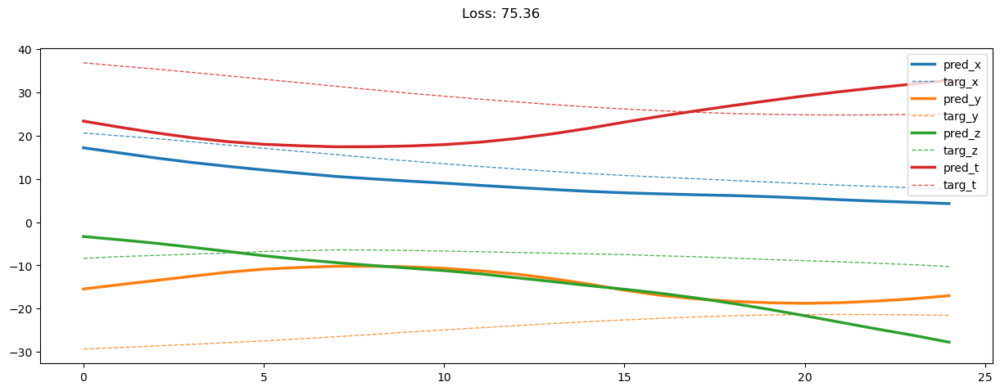

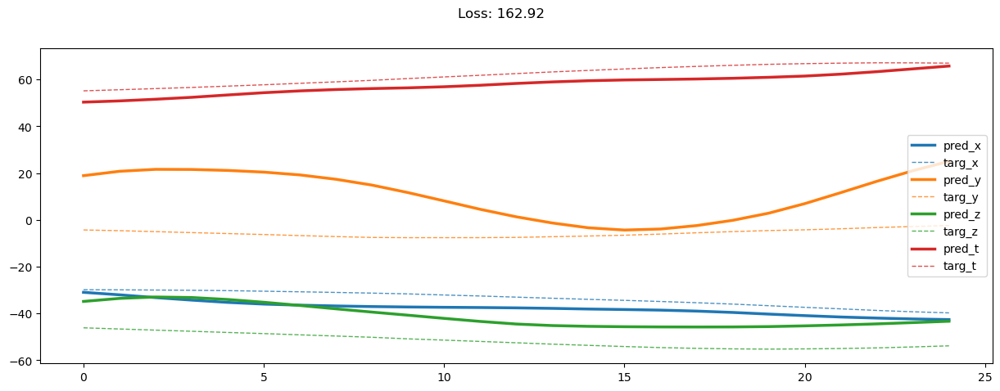

00020: train loss:  188.958, imu loss:  0.126, mag loss:  64.849, div loss:  118.904, slim:  4.269, tlim:  5.350
       valid loss:  191.125, imu loss:  0.095, mag loss:  94.374, div loss:  92.003, slim:  2.903, tlim:  5.236
00040: train loss:  189.883, imu loss:  0.125, mag loss:  65.259, div loss:  119.462, slim:  4.216, tlim:  5.309
       valid loss:  190.463, imu loss:  0.095, mag loss:  93.199, div loss:  92.454, slim:  2.986, tlim:  5.291
00060: train loss:  189.280, imu loss:  0.126, mag loss:  64.907, div loss:  119.223, slim:  4.220, tlim:  5.291
       valid loss:  191.764, imu loss:  0.095, mag loss:  94.119, div loss:  92.872, slim:  2.860, tlim:  5.285
00080: train loss:  189.208, imu loss:  0.126, mag loss:  64.602, div loss:  119.490, slim:  4.175, tlim:  5.262
       valid loss:  188.997, imu loss:  0.095, mag loss:  92.874, div loss:  91.376, slim:  2.943, tlim:  5.221
00100: train loss:  189.755, imu loss:  0.126, mag loss:  64.868, div loss:  119.696, slim:  4.276, 

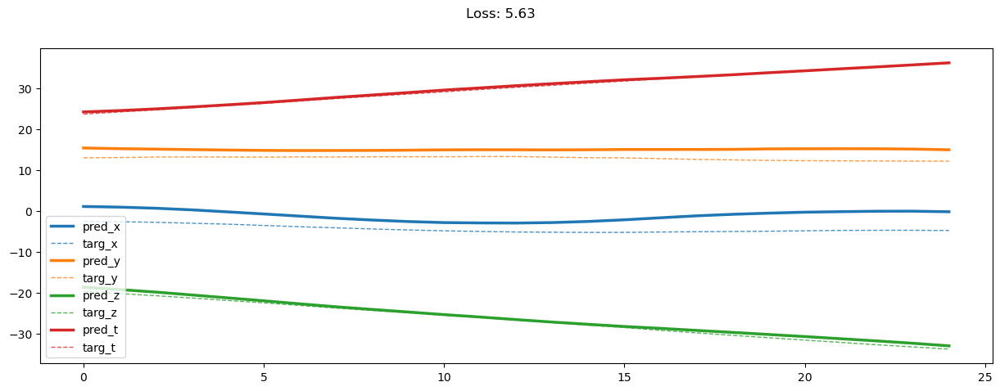

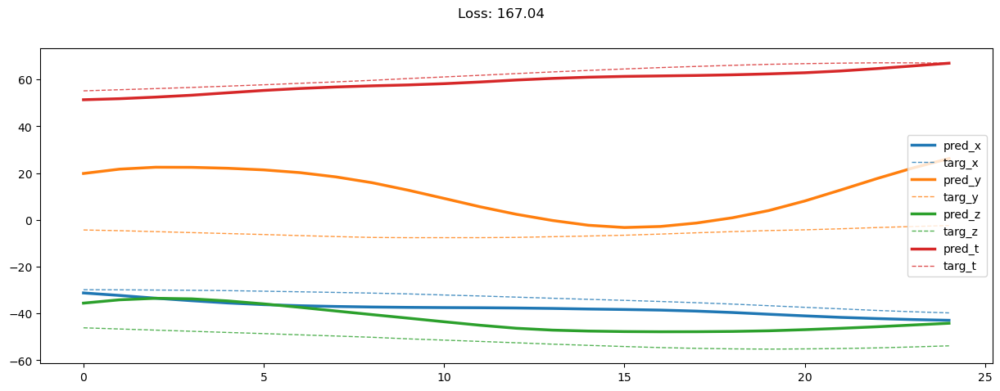

00200: train loss:  188.944, imu loss:  0.126, mag loss:  64.750, div loss:  119.034, slim:  4.248, tlim:  5.297
       valid loss:  194.120, imu loss:  0.095, mag loss:  95.790, div loss:  93.602, slim:  2.959, tlim:  5.191
00220: train loss:  188.286, imu loss:  0.126, mag loss:  64.441, div loss:  118.712, slim:  4.182, tlim:  5.282
       valid loss:  193.052, imu loss:  0.095, mag loss:  95.103, div loss:  93.192, slim:  2.972, tlim:  5.226
00240: train loss:  189.567, imu loss:  0.126, mag loss:  64.748, div loss:  119.672, slim:  4.226, tlim:  5.287
       valid loss:  191.309, imu loss:  0.095, mag loss:  94.197, div loss:  92.295, slim:  3.036, tlim:  5.284
00260: train loss:  188.293, imu loss:  0.126, mag loss:  64.184, div loss:  118.970, slim:  4.224, tlim:  5.276
       valid loss:  194.218, imu loss:  0.095, mag loss:  96.300, div loss:  93.101, slim:  3.040, tlim:  5.283
00280: train loss:  189.486, imu loss:  0.126, mag loss:  64.599, div loss:  119.798, slim:  4.165, 

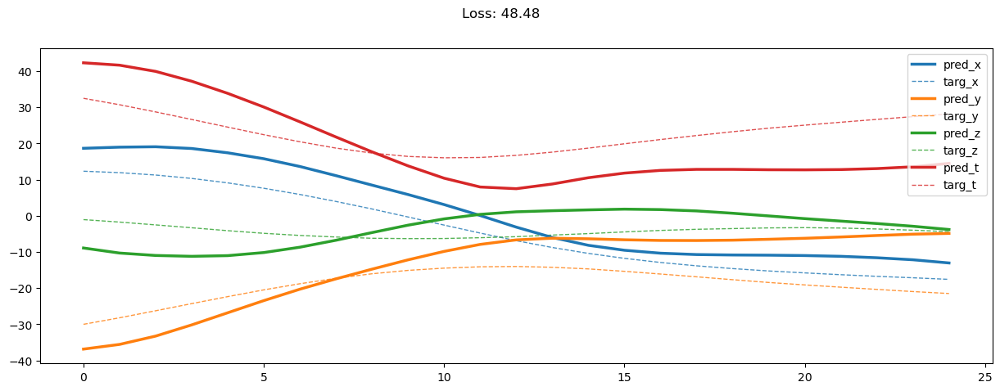

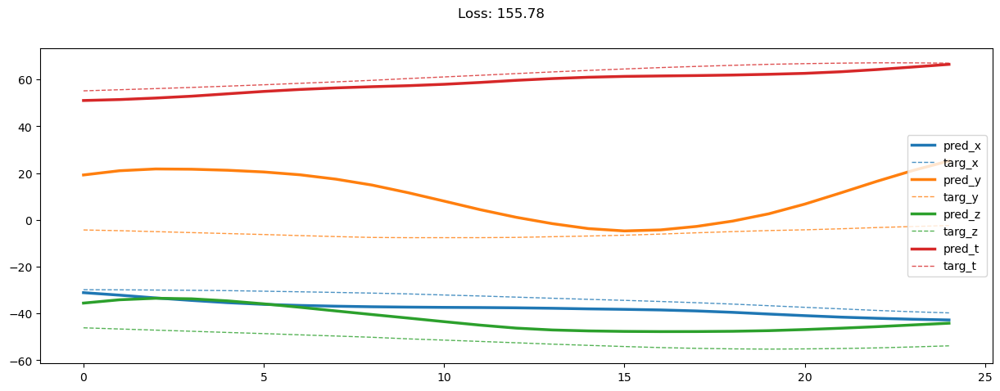

00400: train loss:  187.927, imu loss:  0.127, mag loss:  64.193, div loss:  118.603, slim:  4.208, tlim:  5.269
       valid loss:  194.680, imu loss:  0.095, mag loss:  96.052, div loss:  93.894, slim:  2.921, tlim:  5.211
00420: train loss:  186.055, imu loss:  0.125, mag loss:  63.774, div loss:  117.140, slim:  4.239, tlim:  5.275
       valid loss:  191.716, imu loss:  0.095, mag loss:  94.572, div loss:  92.377, slim:  3.020, tlim:  5.223
00440: train loss:  188.328, imu loss:  0.126, mag loss:  64.308, div loss:  118.853, slim:  4.260, tlim:  5.302
       valid loss:  195.205, imu loss:  0.095, mag loss:  97.012, div loss:  93.445, slim:  2.971, tlim:  5.215
00460: train loss:  187.016, imu loss:  0.125, mag loss:  63.955, div loss:  117.957, slim:  4.205, tlim:  5.236
       valid loss:  196.552, imu loss:  0.095, mag loss:  97.877, div loss:  93.917, slim:  2.956, tlim:  5.233
00480: train loss:  186.341, imu loss:  0.126, mag loss:  63.710, div loss:  117.564, slim:  4.163, 

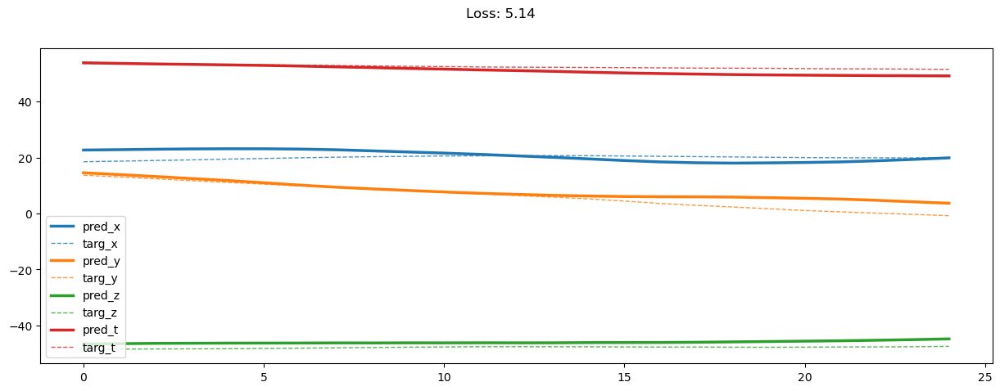

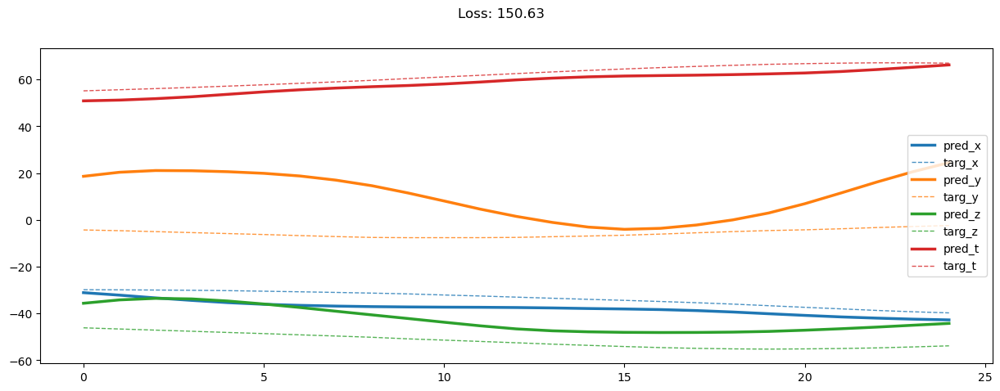

00600: train loss:  186.176, imu loss:  0.125, mag loss:  63.622, div loss:  117.436, slim:  4.196, tlim:  5.259
       valid loss:  192.112, imu loss:  0.095, mag loss:  95.085, div loss:  92.251, slim:  2.983, tlim:  5.249
00620: train loss:  184.633, imu loss:  0.125, mag loss:  63.234, div loss:  116.350, slim:  4.123, tlim:  5.190
       valid loss:  193.850, imu loss:  0.095, mag loss:  96.048, div loss:  93.003, slim:  3.063, tlim:  5.252
00640: train loss:  184.110, imu loss:  0.125, mag loss:  63.038, div loss:  116.029, slim:  4.127, tlim:  5.181
       valid loss:  194.932, imu loss:  0.095, mag loss:  95.930, div loss:  94.249, slim:  2.844, tlim:  5.263
00660: train loss:  184.888, imu loss:  0.126, mag loss:  63.051, div loss:  116.784, slim:  4.155, tlim:  5.185
       valid loss:  194.029, imu loss:  0.094, mag loss:  96.324, div loss:  92.931, slim:  3.057, tlim:  5.220
00680: train loss:  183.462, imu loss:  0.125, mag loss:  63.221, div loss:  115.125, slim:  4.226, 

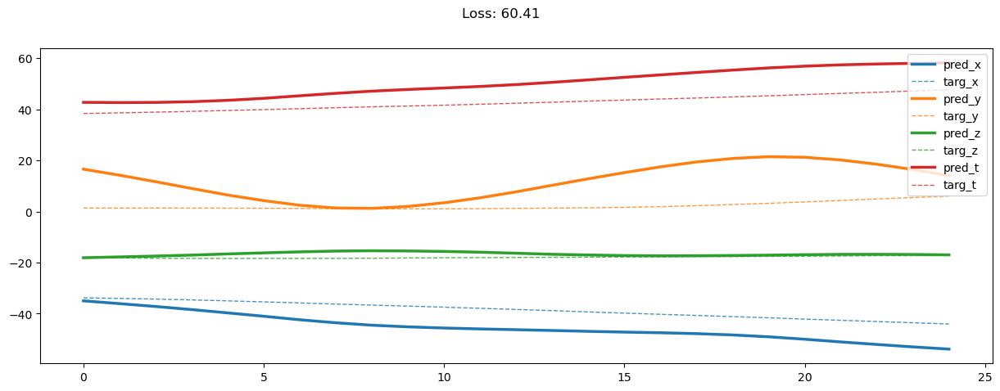

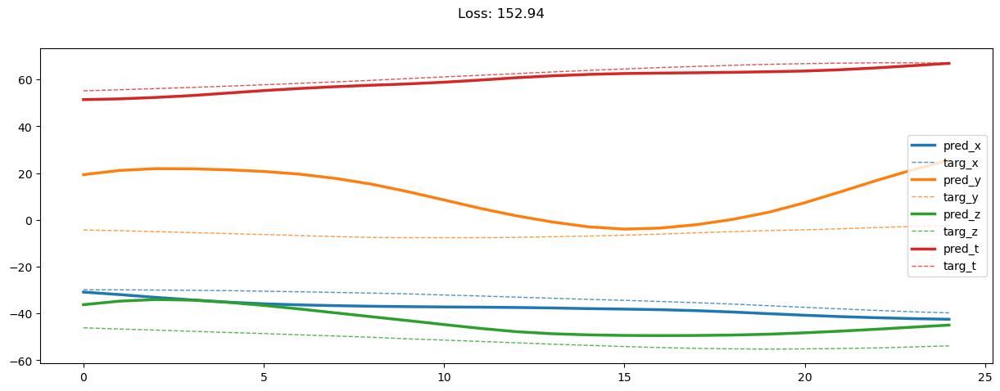

00800: train loss:  184.623, imu loss:  0.126, mag loss:  63.057, div loss:  116.450, slim:  4.229, tlim:  5.244
       valid loss:  197.008, imu loss:  0.094, mag loss:  97.377, div loss:  94.902, slim:  2.888, tlim:  5.217
00820: train loss:  184.199, imu loss:  0.126, mag loss:  63.095, div loss:  115.975, slim:  4.251, tlim:  5.254
       valid loss:  192.496, imu loss:  0.094, mag loss:  93.434, div loss:  94.238, slim:  3.011, tlim:  5.303
00840: train loss:  184.160, imu loss:  0.125, mag loss:  63.011, div loss:  116.028, slim:  4.207, tlim:  5.258
       valid loss:  193.720, imu loss:  0.094, mag loss:  95.383, div loss:  93.518, slim:  3.038, tlim:  5.287
00860: train loss:  185.188, imu loss:  0.125, mag loss:  63.093, div loss:  116.977, slim:  4.205, tlim:  5.256
       valid loss:  197.380, imu loss:  0.094, mag loss:  97.640, div loss:  94.976, slim:  2.890, tlim:  5.262
00880: train loss:  182.711, imu loss:  0.125, mag loss:  62.474, div loss:  115.177, slim:  4.146, 

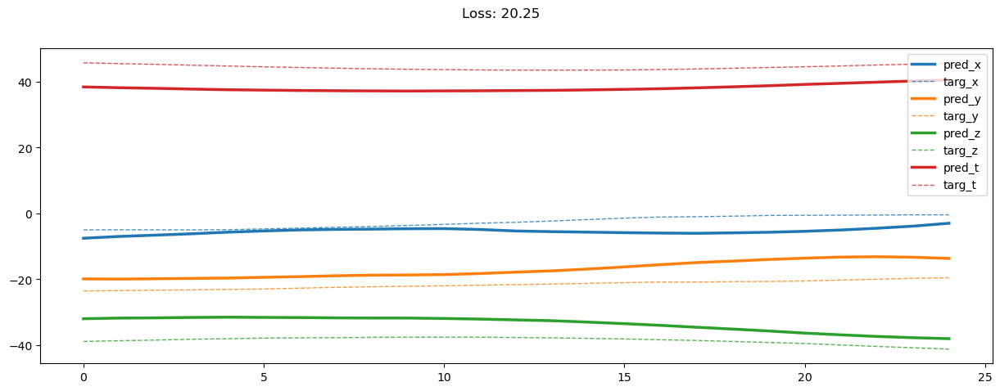

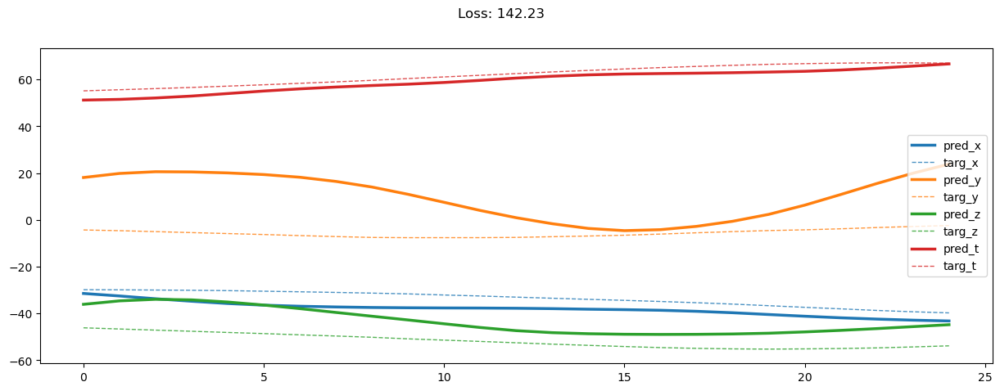

01000: train loss:  182.121, imu loss:  0.125, mag loss:  62.477, div loss:  114.579, slim:  4.179, tlim:  5.194
       valid loss:  197.985, imu loss:  0.094, mag loss:  97.226, div loss:  95.996, slim:  2.812, tlim:  5.289
01020: train loss:  181.263, imu loss:  0.125, mag loss:  62.291, div loss:  113.908, slim:  4.136, tlim:  5.207
       valid loss:  194.176, imu loss:  0.094, mag loss:  95.376, div loss:  93.966, slim:  3.224, tlim:  5.244
01040: train loss:  180.924, imu loss:  0.125, mag loss:  61.954, div loss:  113.951, slim:  4.118, tlim:  5.153
       valid loss:  196.990, imu loss:  0.094, mag loss:  97.239, div loss:  94.966, slim:  2.914, tlim:  5.283
01060: train loss:  181.157, imu loss:  0.125, mag loss:  62.272, div loss:  113.845, slim:  4.133, tlim:  5.175
       valid loss:  196.312, imu loss:  0.094, mag loss:  96.863, div loss:  94.618, slim:  3.120, tlim:  5.276
01080: train loss:  181.391, imu loss:  0.124, mag loss:  62.131, div loss:  114.189, slim:  4.214, 

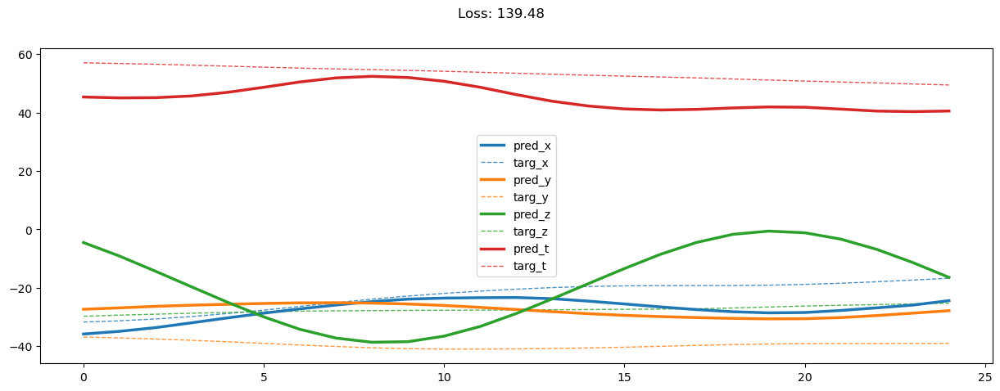

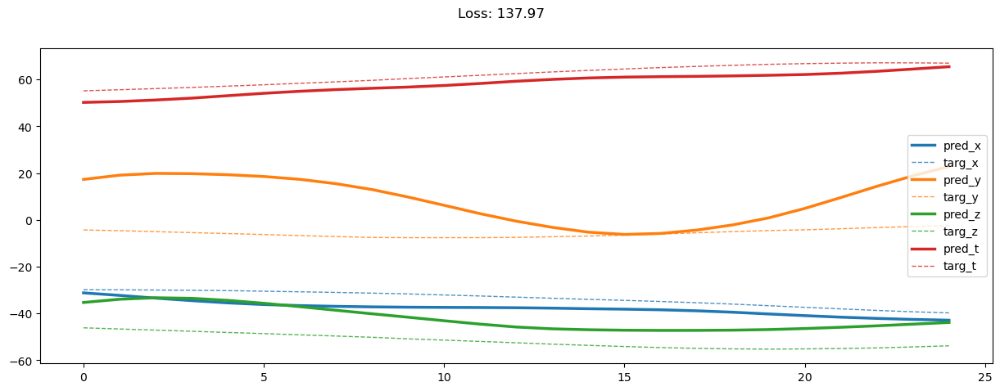

01200: train loss:  180.478, imu loss:  0.125, mag loss:  61.950, div loss:  113.509, slim:  4.128, tlim:  5.149
       valid loss:  195.269, imu loss:  0.094, mag loss:  95.032, div loss:  95.417, slim:  3.153, tlim:  5.249
01220: train loss:  180.226, imu loss:  0.125, mag loss:  61.682, div loss:  113.474, slim:  4.201, tlim:  5.192
       valid loss:  199.258, imu loss:  0.094, mag loss:  98.731, div loss:  95.735, slim:  3.093, tlim:  5.232
01240: train loss:  179.979, imu loss:  0.126, mag loss:  61.484, div loss:  113.459, slim:  4.159, tlim:  5.161
       valid loss:  196.913, imu loss:  0.094, mag loss:  96.330, div loss:  95.803, slim:  3.042, tlim:  5.234
01260: train loss:  180.663, imu loss:  0.125, mag loss:  61.805, div loss:  113.839, slim:  4.112, tlim:  5.155
       valid loss:  198.396, imu loss:  0.094, mag loss:  97.484, div loss:  96.050, slim:  3.072, tlim:  5.334
01280: train loss:  181.406, imu loss:  0.125, mag loss:  62.131, div loss:  114.216, slim:  4.156, 

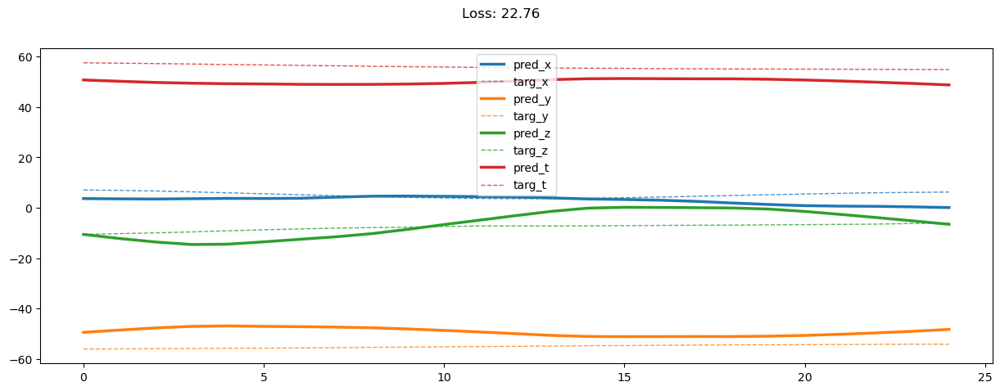

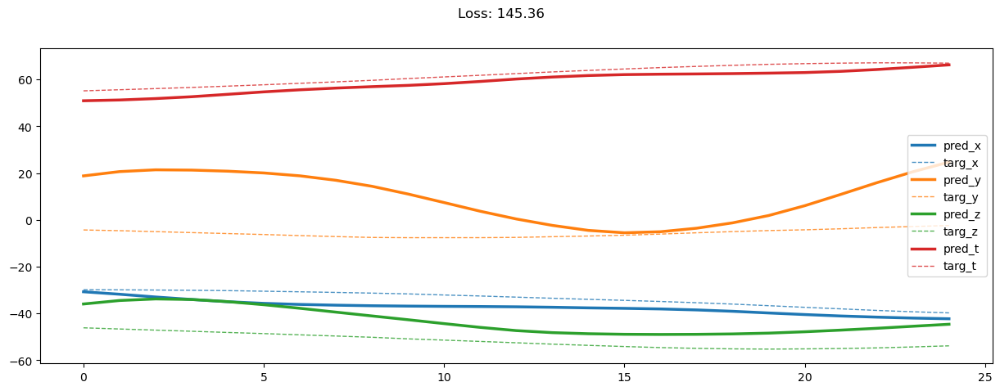

01400: train loss:  180.808, imu loss:  0.125, mag loss:  61.672, div loss:  114.154, slim:  4.052, tlim:  5.125
       valid loss:  197.500, imu loss:  0.094, mag loss:  97.324, div loss:  95.327, slim:  3.242, tlim:  5.259
01420: train loss:  179.142, imu loss:  0.125, mag loss:  61.383, div loss:  112.770, slim:  4.081, tlim:  5.126
       valid loss:  200.084, imu loss:  0.094, mag loss:  98.777, div loss:  96.422, slim:  3.245, tlim:  5.307
01440: train loss:  180.255, imu loss:  0.125, mag loss:  61.637, div loss:  113.566, slim:  4.187, tlim:  5.173
       valid loss:  202.557, imu loss:  0.094, mag loss:  99.201, div loss:  98.551, slim:  3.090, tlim:  5.252
01460: train loss:  180.072, imu loss:  0.125, mag loss:  61.192, div loss:  113.843, slim:  4.143, tlim:  5.169
       valid loss:  199.733, imu loss:  0.094, mag loss:  98.038, div loss:  96.895, slim:  2.983, tlim:  5.282
01480: train loss:  177.605, imu loss:  0.124, mag loss:  60.887, div loss:  111.678, slim:  4.167, 

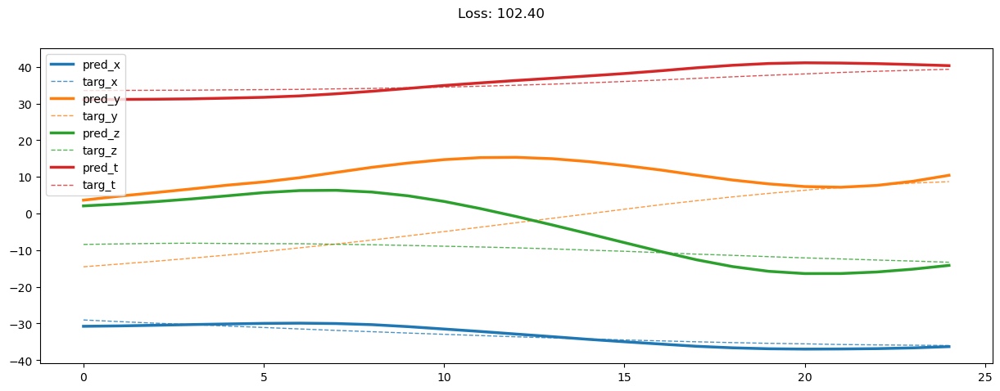

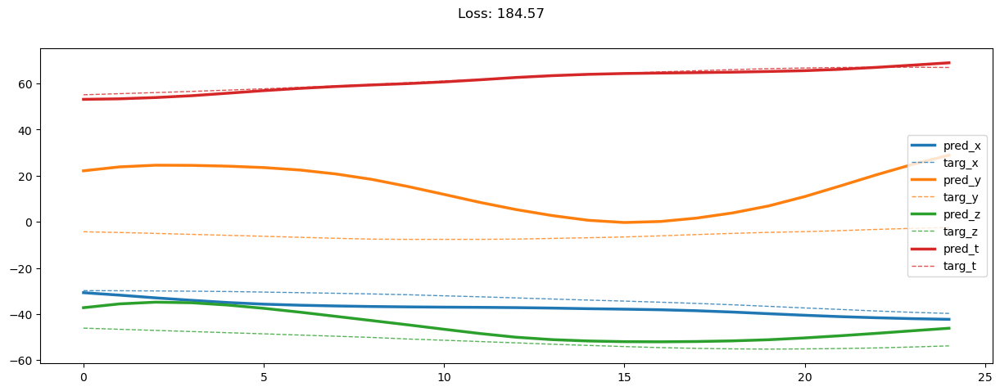

01600: train loss:  179.364, imu loss:  0.124, mag loss:  61.370, div loss:  112.917, slim:  4.215, tlim:  5.198
       valid loss:  204.287, imu loss:  0.094, mag loss:  101.888, div loss:  97.577, slim:  2.999, tlim:  5.305
01620: train loss:  176.939, imu loss:  0.125, mag loss:  60.543, div loss:  111.443, slim:  4.052, tlim:  5.086
       valid loss:  197.806, imu loss:  0.094, mag loss:  96.461, div loss:  96.550, slim:  3.069, tlim:  5.246
01640: train loss:  177.791, imu loss:  0.125, mag loss:  60.627, div loss:  112.213, slim:  4.049, tlim:  5.086
       valid loss:  201.210, imu loss:  0.094, mag loss:  98.107, div loss:  98.372, slim:  3.008, tlim:  5.181
01660: train loss:  177.467, imu loss:  0.124, mag loss:  60.741, div loss:  111.679, slim:  4.182, tlim:  5.169
       valid loss:  204.574, imu loss:  0.094, mag loss:  100.161, div loss:  99.511, slim:  3.240, tlim:  5.332
01680: train loss:  177.394, imu loss:  0.124, mag loss:  60.891, div loss:  111.491, slim:  4.169

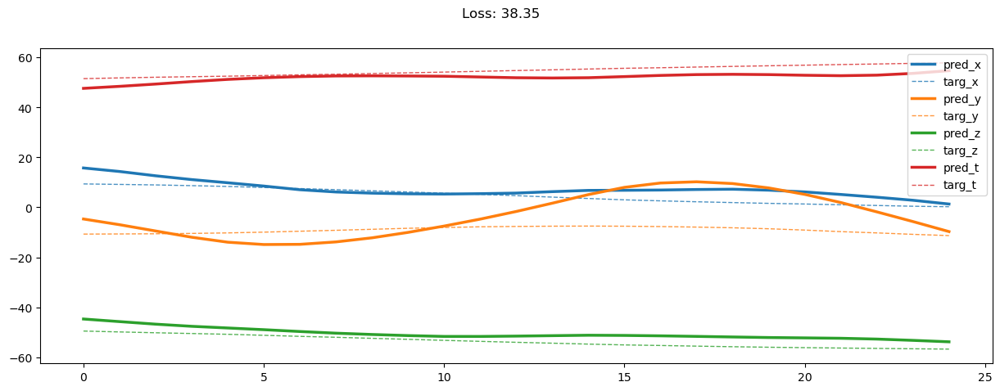

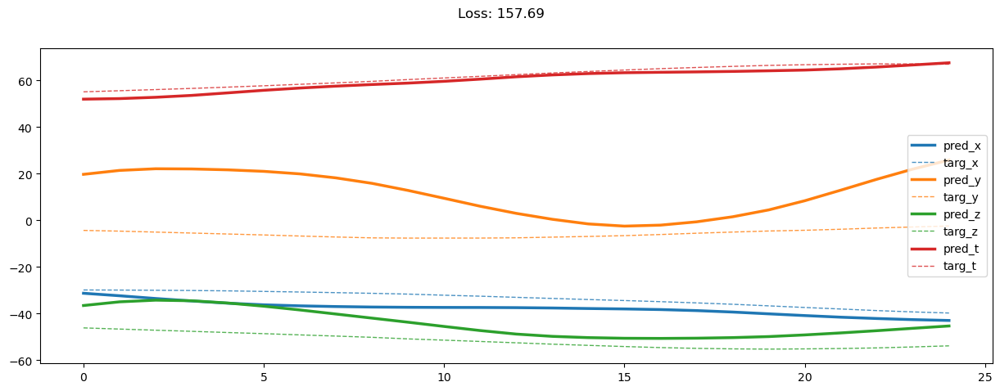

01800: train loss:  175.716, imu loss:  0.124, mag loss:  60.340, div loss:  110.364, slim:  4.147, tlim:  5.134
       valid loss:  202.587, imu loss:  0.094, mag loss:  99.491, div loss:  98.283, slim:  3.057, tlim:  5.273
01820: train loss:  176.482, imu loss:  0.125, mag loss:  60.276, div loss:  111.211, slim:  4.140, tlim:  5.114
       valid loss:  200.379, imu loss:  0.094, mag loss:  97.664, div loss:  97.906, slim:  3.097, tlim:  5.255
01840: train loss:  176.850, imu loss:  0.124, mag loss:  60.392, div loss:  111.483, slim:  4.109, tlim:  5.098
       valid loss:  202.973, imu loss:  0.093, mag loss:  97.987, div loss:  100.094, slim:  3.210, tlim:  5.328
01860: train loss:  177.718, imu loss:  0.124, mag loss:  60.591, div loss:  112.196, slim:  4.067, tlim:  5.053
       valid loss:  202.120, imu loss:  0.094, mag loss:  99.504, div loss:  97.843, slim:  2.953, tlim:  5.255
01880: train loss:  177.689, imu loss:  0.125, mag loss:  60.417, div loss:  112.350, slim:  4.037,

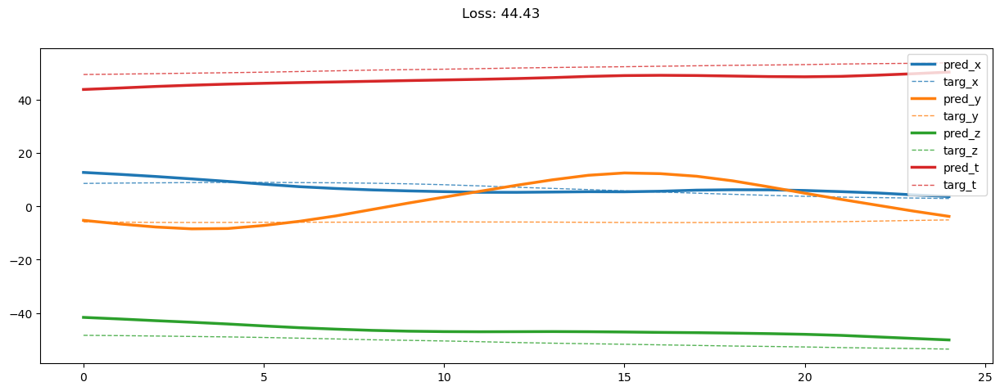

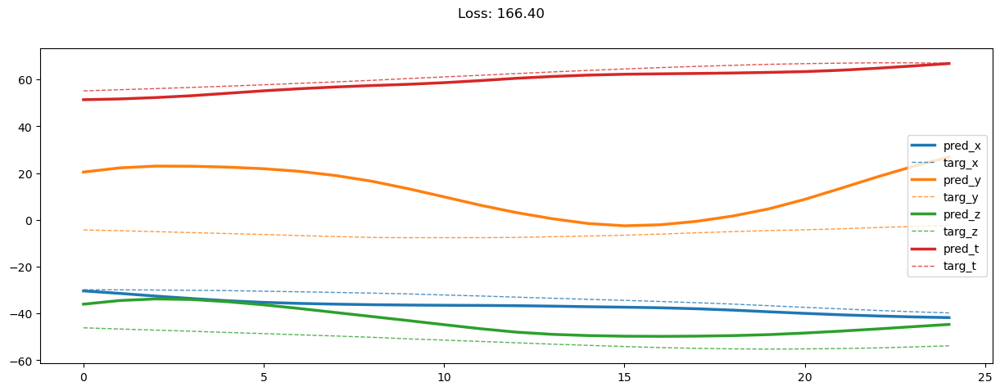

02000: train loss:  175.686, imu loss:  0.124, mag loss:  60.001, div loss:  110.737, slim:  4.084, tlim:  5.071
       valid loss:  202.362, imu loss:  0.093, mag loss:  99.575, div loss:  97.756, slim:  3.536, tlim:  5.405
02020: train loss:  175.344, imu loss:  0.124, mag loss:  59.884, div loss:  110.519, slim:  4.082, tlim:  5.062
       valid loss:  203.676, imu loss:  0.093, mag loss:  99.284, div loss:  99.543, slim:  3.101, tlim:  5.306
02040: train loss:  175.665, imu loss:  0.125, mag loss:  59.945, div loss:  110.709, slim:  4.147, tlim:  5.133
       valid loss:  209.941, imu loss:  0.093, mag loss:  101.165, div loss:  103.740, slim:  3.478, tlim:  5.430
02060: train loss:  174.371, imu loss:  0.124, mag loss:  59.613, div loss:  109.815, slim:  4.051, tlim:  5.075
       valid loss:  205.772, imu loss:  0.093, mag loss:  99.953, div loss:  100.955, slim:  3.061, tlim:  5.340
02080: train loss:  175.319, imu loss:  0.125, mag loss:  59.787, div loss:  110.552, slim:  4.14

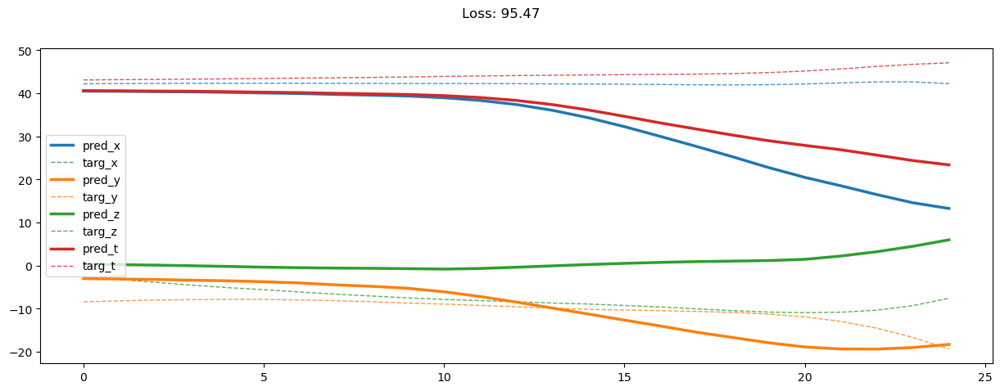

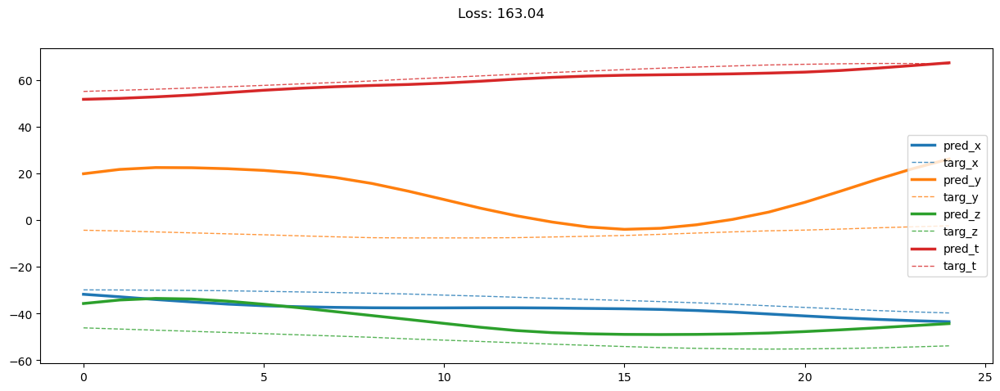

02200: train loss:  175.378, imu loss:  0.124, mag loss:  59.425, div loss:  110.993, slim:  4.109, tlim:  5.078
       valid loss:  207.806, imu loss:  0.093, mag loss:  100.152, div loss:  102.687, slim:  3.390, tlim:  5.368
02220: train loss:  173.795, imu loss:  0.124, mag loss:  59.374, div loss:  109.494, slim:  4.083, tlim:  5.044
       valid loss:  204.334, imu loss:  0.093, mag loss:  97.978, div loss:  101.475, slim:  3.173, tlim:  5.326
02240: train loss:  172.907, imu loss:  0.124, mag loss:  59.120, div loss:  108.801, slim:  4.111, tlim:  5.112
       valid loss:  207.364, imu loss:  0.093, mag loss:  101.136, div loss:  101.388, slim:  3.149, tlim:  5.278
02260: train loss:  172.965, imu loss:  0.125, mag loss:  59.151, div loss:  108.902, slim:  4.067, tlim:  5.028
       valid loss:  203.855, imu loss:  0.093, mag loss:  99.198, div loss:  99.762, slim:  3.225, tlim:  5.326
02280: train loss:  173.320, imu loss:  0.124, mag loss:  59.152, div loss:  109.194, slim:  4.

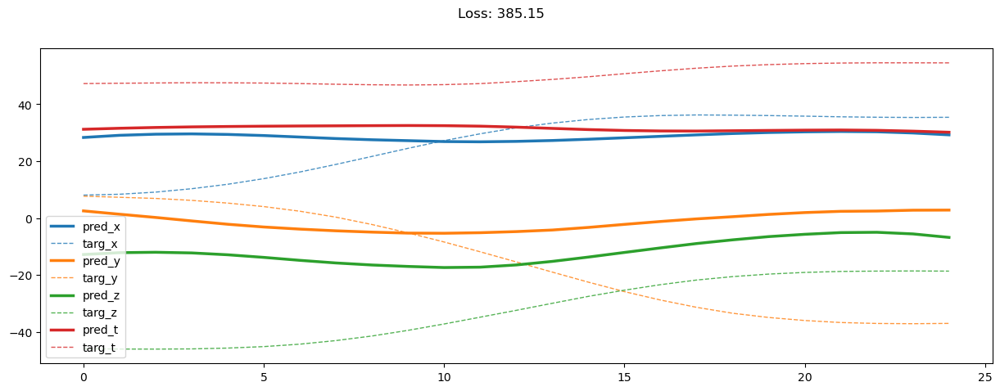

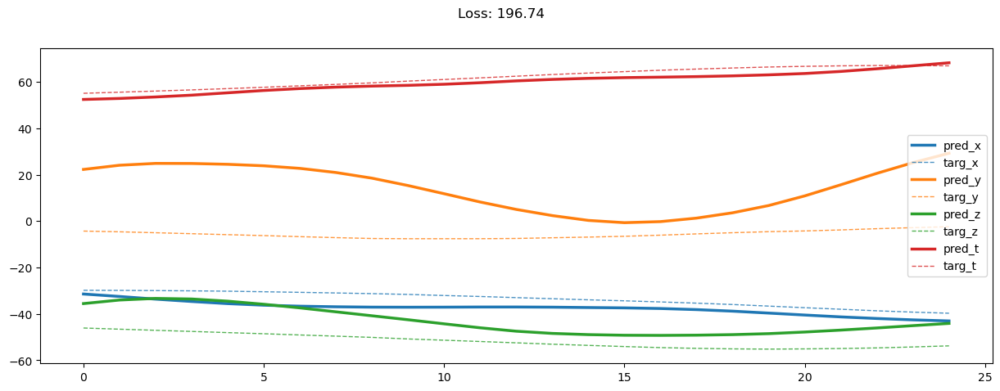

02400: train loss:  170.729, imu loss:  0.124, mag loss:  58.629, div loss:  107.181, slim:  4.043, tlim:  5.046
       valid loss:  207.161, imu loss:  0.093, mag loss:  100.268, div loss:  101.928, slim:  3.319, tlim:  5.389
02420: train loss:  172.221, imu loss:  0.124, mag loss:  59.038, div loss:  108.218, slim:  4.109, tlim:  5.085
       valid loss:  215.238, imu loss:  0.093, mag loss:  104.022, div loss:  106.237, slim:  3.282, tlim:  5.421
02440: train loss:  172.406, imu loss:  0.124, mag loss:  58.966, div loss:  108.506, slim:  4.092, tlim:  5.049
       valid loss:  207.537, imu loss:  0.093, mag loss:  100.551, div loss:  102.000, slim:  3.334, tlim:  5.413
02460: train loss:  172.414, imu loss:  0.124, mag loss:  58.699, div loss:  108.791, slim:  4.106, tlim:  5.031
       valid loss:  205.373, imu loss:  0.093, mag loss:  98.594, div loss:  101.876, slim:  3.217, tlim:  5.340
02480: train loss:  171.675, imu loss:  0.124, mag loss:  58.794, div loss:  107.946, slim:  

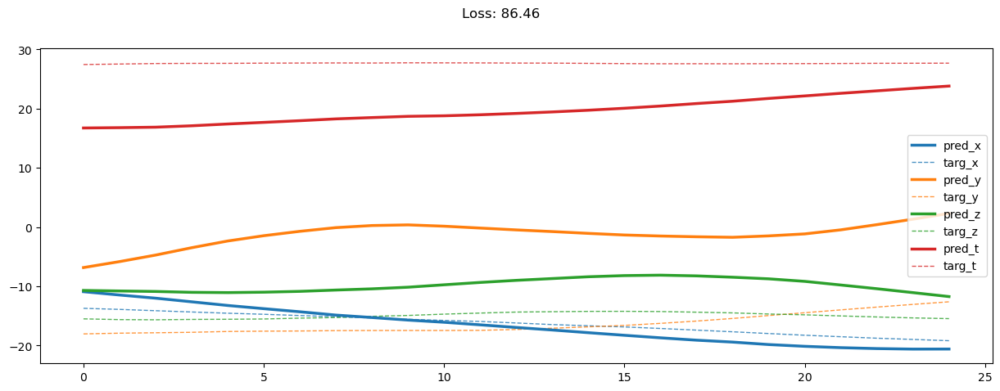

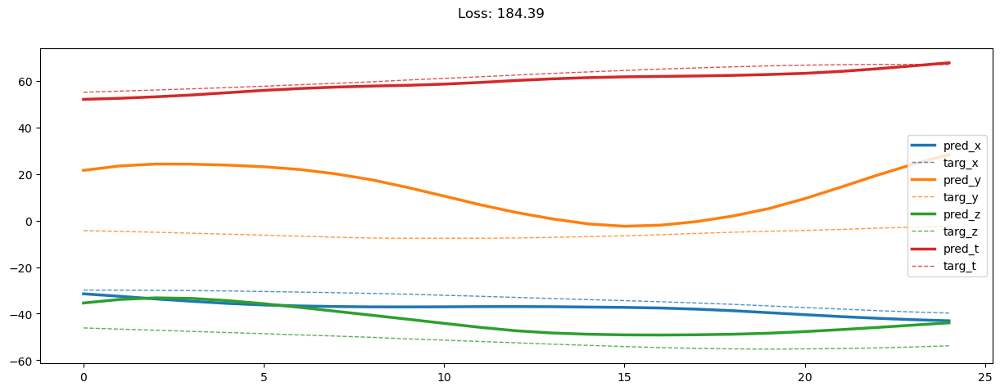

02600: train loss:  170.733, imu loss:  0.124, mag loss:  58.283, div loss:  107.560, slim:  4.047, tlim:  5.007
       valid loss:  212.637, imu loss:  0.093, mag loss:  102.280, div loss:  105.384, slim:  3.367, tlim:  5.385
02620: train loss:  171.451, imu loss:  0.124, mag loss:  58.600, div loss:  107.954, slim:  4.051, tlim:  5.014
       valid loss:  209.945, imu loss:  0.093, mag loss:  101.107, div loss:  103.881, slim:  3.361, tlim:  5.365
02640: train loss:  172.651, imu loss:  0.124, mag loss:  58.579, div loss:  109.162, slim:  4.080, tlim:  5.020
       valid loss:  204.089, imu loss:  0.093, mag loss:  97.511, div loss:  101.614, slim:  3.321, tlim:  5.388
02660: train loss:  170.587, imu loss:  0.124, mag loss:  58.309, div loss:  107.331, slim:  4.136, tlim:  5.053
       valid loss:  213.330, imu loss:  0.093, mag loss:  102.317, div loss:  106.058, slim:  3.186, tlim:  5.421
02680: train loss:  170.575, imu loss:  0.124, mag loss:  58.248, div loss:  107.391, slim:  

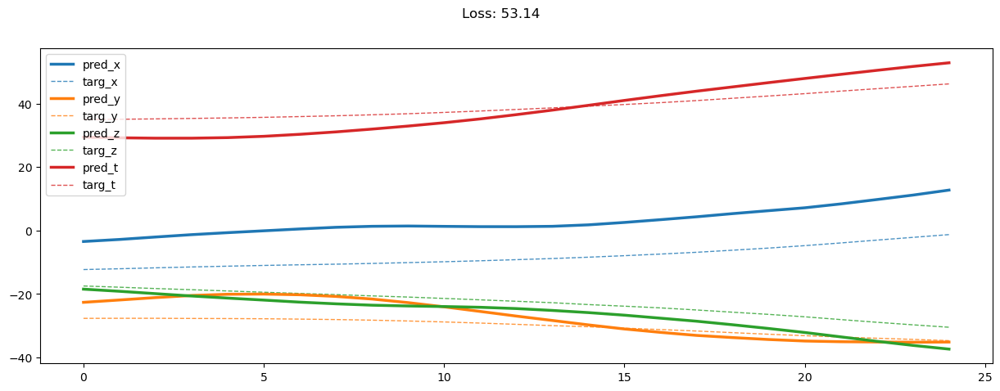

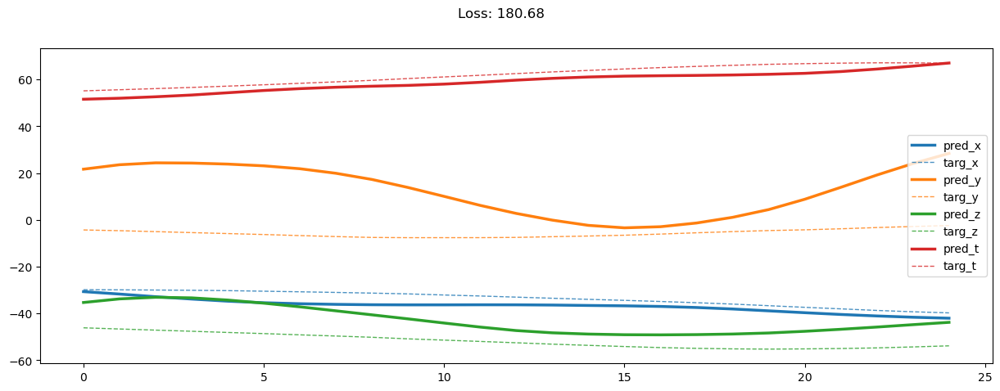

02800: train loss:  169.965, imu loss:  0.124, mag loss:  58.380, div loss:  106.657, slim:  4.097, tlim:  5.039
       valid loss:  220.526, imu loss:  0.093, mag loss:  105.894, div loss:  109.594, slim:  3.472, tlim:  5.437
02820: train loss:  169.168, imu loss:  0.124, mag loss:  58.095, div loss:  106.164, slim:  4.074, tlim:  5.022
       valid loss:  219.521, imu loss:  0.093, mag loss:  105.579, div loss:  108.878, slim:  3.356, tlim:  5.510
02840: train loss:  169.235, imu loss:  0.124, mag loss:  57.866, div loss:  106.480, slim:  4.071, tlim:  4.996
       valid loss:  214.895, imu loss:  0.093, mag loss:  103.534, div loss:  106.360, slim:  3.311, tlim:  5.439
02860: train loss:  169.339, imu loss:  0.123, mag loss:  58.038, div loss:  106.377, slim:  4.125, tlim:  5.025
       valid loss:  220.154, imu loss:  0.093, mag loss:  104.628, div loss:  110.381, slim:  3.489, tlim:  5.573
02880: train loss:  169.097, imu loss:  0.124, mag loss:  57.617, div loss:  106.575, slim: 

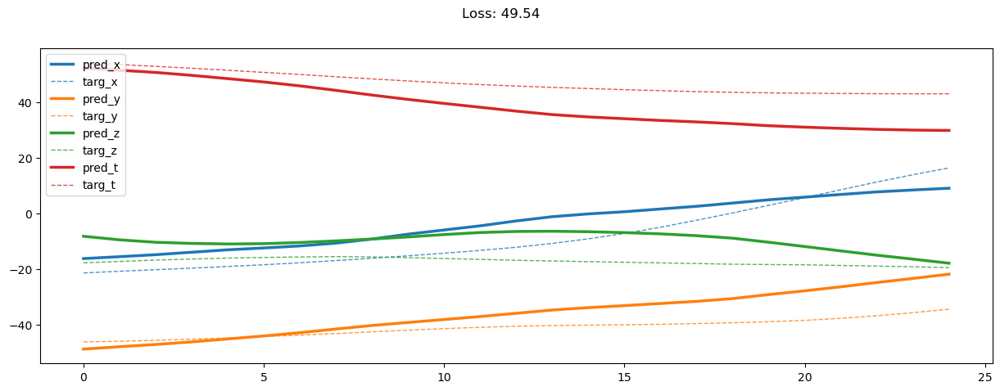

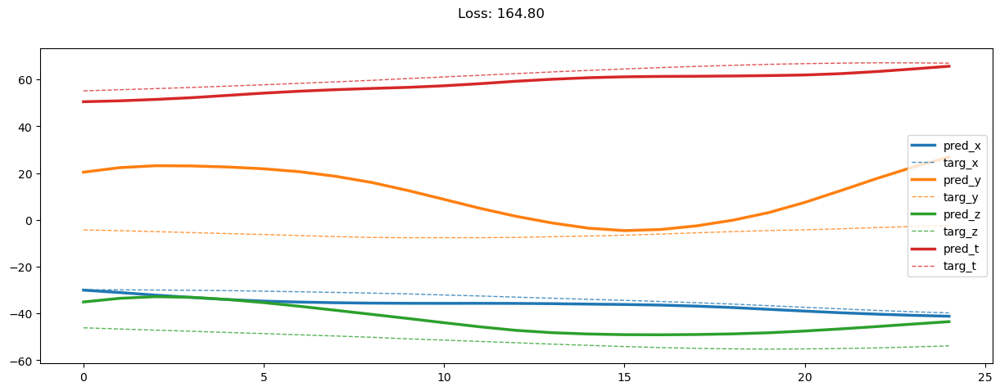

03000: train loss:  168.593, imu loss:  0.124, mag loss:  57.539, div loss:  106.144, slim:  4.120, tlim:  5.007
       valid loss:  213.897, imu loss:  0.093, mag loss:  102.263, div loss:  106.676, slim:  3.251, tlim:  5.403
03020: train loss:  167.760, imu loss:  0.124, mag loss:  57.369, div loss:  105.519, slim:  4.040, tlim:  4.984
       valid loss:  216.170, imu loss:  0.093, mag loss:  103.474, div loss:  107.737, slim:  3.264, tlim:  5.399
03040: train loss:  168.902, imu loss:  0.124, mag loss:  57.729, div loss:  106.269, slim:  4.087, tlim:  5.011
       valid loss:  217.110, imu loss:  0.093, mag loss:  104.902, div loss:  107.163, slim:  3.441, tlim:  5.455
03060: train loss:  169.745, imu loss:  0.124, mag loss:  57.749, div loss:  107.084, slim:  4.090, tlim:  5.021
       valid loss:  220.066, imu loss:  0.093, mag loss:  106.498, div loss:  108.554, slim:  3.327, tlim:  5.453
03080: train loss:  166.368, imu loss:  0.123, mag loss:  56.998, div loss:  104.505, slim: 

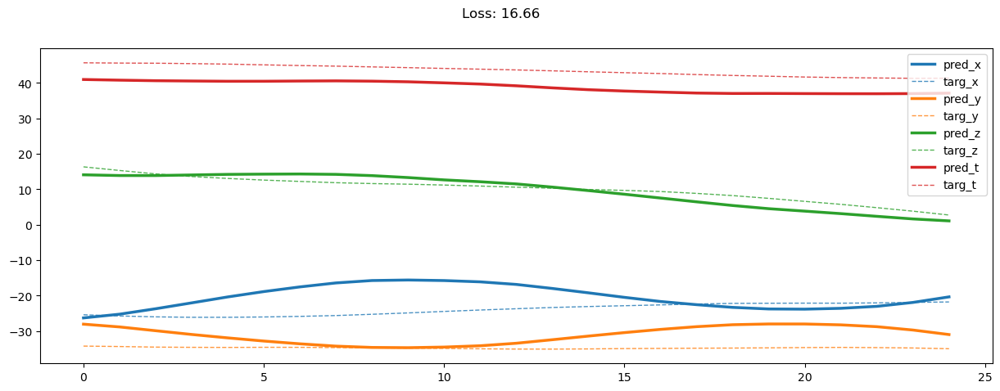

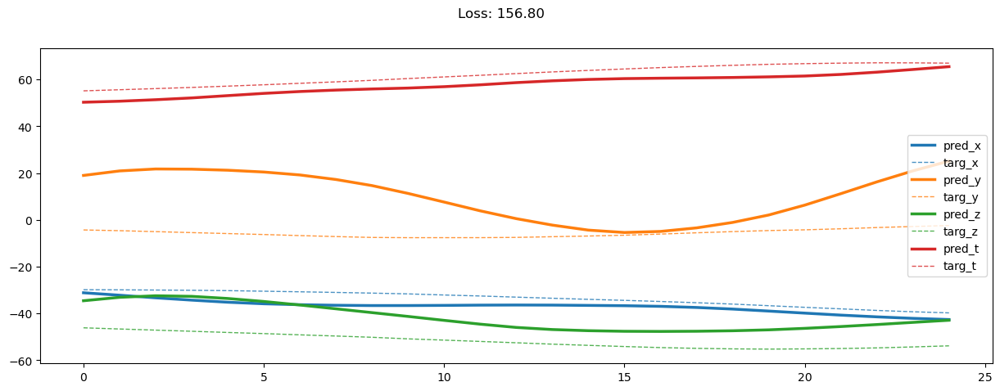

03200: train loss:  168.643, imu loss:  0.124, mag loss:  57.496, div loss:  106.248, slim:  4.096, tlim:  5.002
       valid loss:  222.152, imu loss:  0.093, mag loss:  107.011, div loss:  109.941, slim:  3.513, tlim:  5.639
03220: train loss:  167.675, imu loss:  0.124, mag loss:  57.096, div loss:  105.711, slim:  4.089, tlim:  4.961
       valid loss:  218.170, imu loss:  0.093, mag loss:  105.149, div loss:  107.979, slim:  3.469, tlim:  5.443
03240: train loss:  167.125, imu loss:  0.124, mag loss:  56.926, div loss:  105.342, slim:  4.043, tlim:  4.963
       valid loss:  228.287, imu loss:  0.093, mag loss:  109.710, div loss:  113.391, slim:  3.546, tlim:  5.608
03260: train loss:  166.060, imu loss:  0.123, mag loss:  56.607, div loss:  104.588, slim:  4.085, tlim:  4.962
       valid loss:  222.489, imu loss:  0.093, mag loss:  107.334, div loss:  110.100, slim:  3.369, tlim:  5.492
03280: train loss:  166.302, imu loss:  0.124, mag loss:  56.770, div loss:  104.658, slim: 

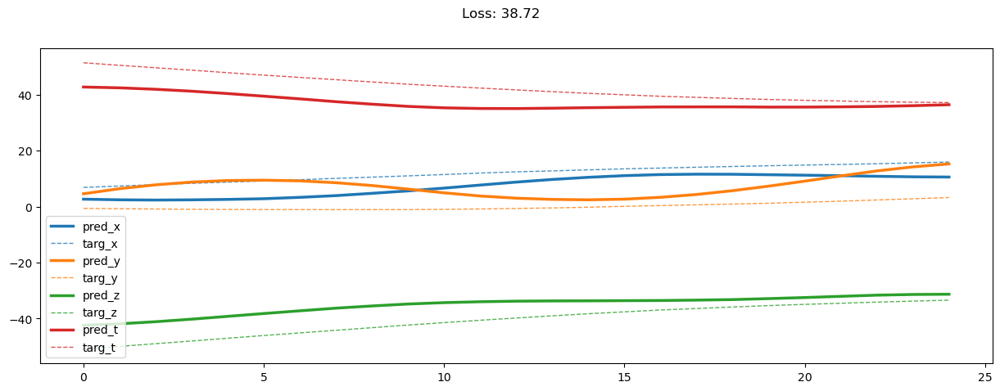

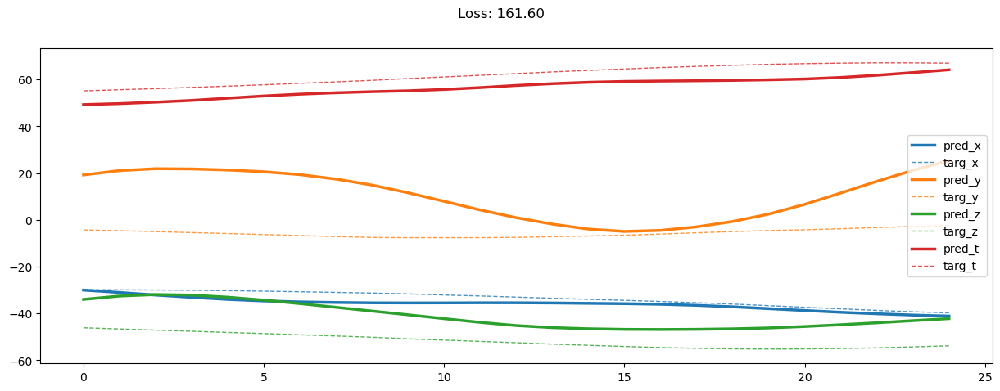

03400: train loss:  165.289, imu loss:  0.123, mag loss:  56.307, div loss:  104.140, slim:  4.073, tlim:  4.933
       valid loss:  221.564, imu loss:  0.093, mag loss:  107.033, div loss:  109.334, slim:  3.523, tlim:  5.630
03420: train loss:  165.304, imu loss:  0.124, mag loss:  56.344, div loss:  104.119, slim:  4.061, tlim:  4.935
       valid loss:  228.094, imu loss:  0.093, mag loss:  110.318, div loss:  112.540, slim:  3.545, tlim:  5.676
03440: train loss:  165.031, imu loss:  0.123, mag loss:  56.244, div loss:  103.924, slim:  4.078, tlim:  4.960
       valid loss:  229.755, imu loss:  0.093, mag loss:  111.438, div loss:  113.092, slim:  3.697, tlim:  5.611
03460: train loss:  166.027, imu loss:  0.124, mag loss:  56.550, div loss:  104.599, slim:  4.092, tlim:  4.975
       valid loss:  231.865, imu loss:  0.093, mag loss:  113.645, div loss:  112.843, slim:  3.798, tlim:  5.780
03480: train loss:  165.245, imu loss:  0.124, mag loss:  56.431, div loss:  103.932, slim: 

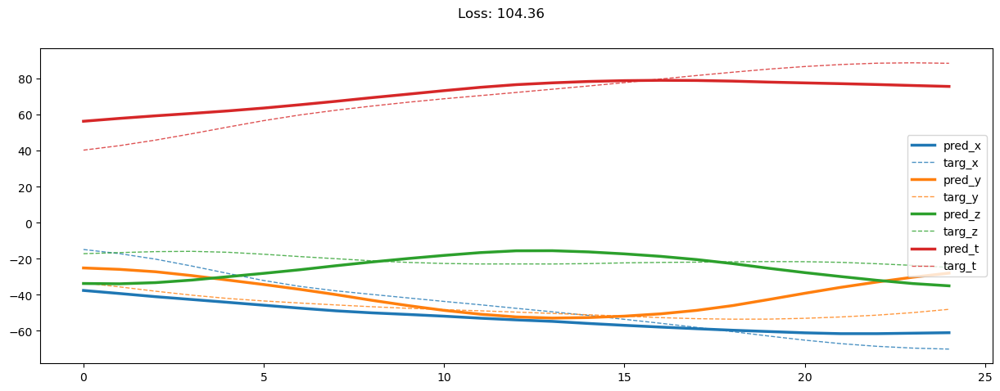

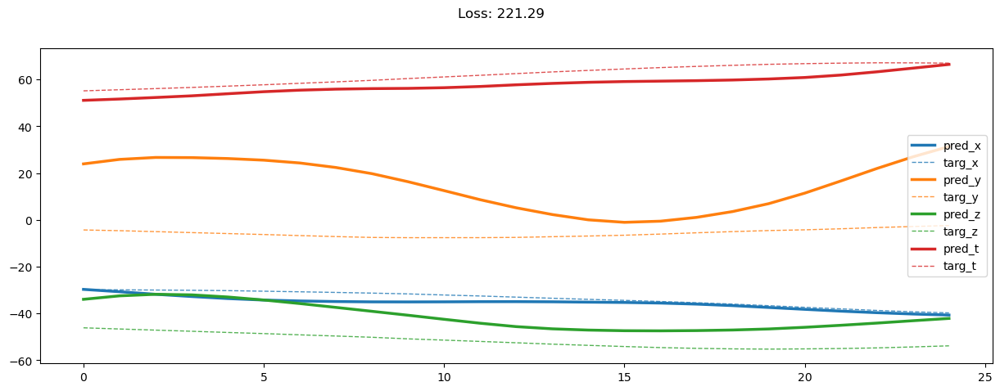

03600: train loss:  165.598, imu loss:  0.123, mag loss:  56.622, div loss:  104.101, slim:  4.093, tlim:  4.971
       valid loss:  220.283, imu loss:  0.093, mag loss:  106.309, div loss:  108.835, slim:  3.415, tlim:  5.589
03620: train loss:  166.575, imu loss:  0.124, mag loss:  56.577, div loss:  105.136, slim:  4.079, tlim:  4.959
       valid loss:  218.381, imu loss:  0.093, mag loss:  104.864, div loss:  108.444, slim:  3.504, tlim:  5.472
03640: train loss:  163.412, imu loss:  0.123, mag loss:  55.936, div loss:  102.614, slim:  4.124, tlim:  4.944
       valid loss:  218.923, imu loss:  0.093, mag loss:  105.346, div loss:  108.480, slim:  3.431, tlim:  5.529
03660: train loss:  163.808, imu loss:  0.124, mag loss:  55.745, div loss:  103.250, slim:  4.023, tlim:  4.912
       valid loss:  226.069, imu loss:  0.093, mag loss:  109.547, div loss:  111.253, slim:  3.736, tlim:  5.658
03680: train loss:  164.502, imu loss:  0.124, mag loss:  55.885, div loss:  103.817, slim: 

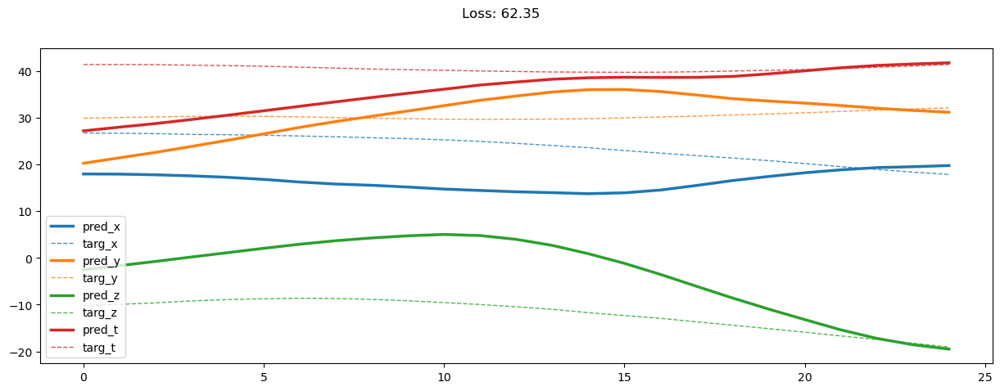

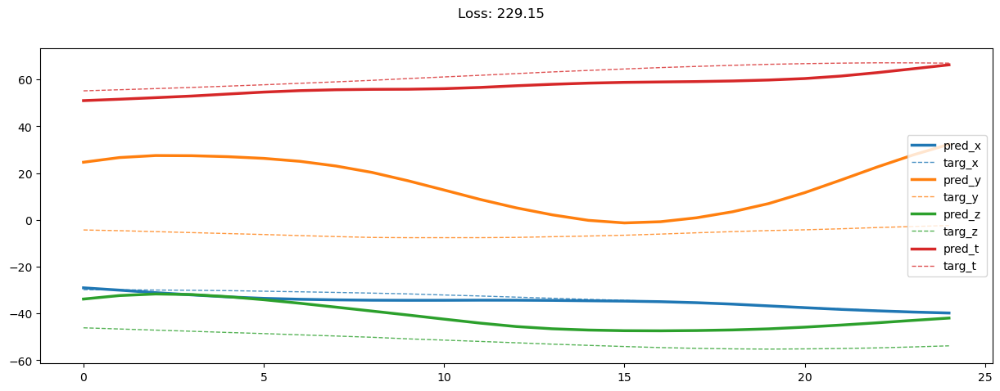

03800: train loss:  163.996, imu loss:  0.124, mag loss:  55.909, div loss:  103.228, slim:  4.107, tlim:  4.945
       valid loss:  226.036, imu loss:  0.093, mag loss:  110.889, div loss:  109.924, slim:  3.630, tlim:  5.630
03820: train loss:  163.361, imu loss:  0.124, mag loss:  55.743, div loss:  102.775, slim:  4.084, tlim:  4.931
       valid loss:  228.613, imu loss:  0.093, mag loss:  111.525, div loss:  111.785, slim:  3.678, tlim:  5.719
03840: train loss:  163.342, imu loss:  0.123, mag loss:  55.601, div loss:  102.876, slim:  4.091, tlim:  4.959
       valid loss:  231.912, imu loss:  0.093, mag loss:  114.531, div loss:  112.056, slim:  3.675, tlim:  5.750
03860: train loss:  163.446, imu loss:  0.124, mag loss:  55.692, div loss:  102.890, slim:  4.104, tlim:  4.952
       valid loss:  226.689, imu loss:  0.093, mag loss:  110.739, div loss:  110.682, slim:  3.653, tlim:  5.683
03880: train loss:  161.517, imu loss:  0.123, mag loss:  54.948, div loss:  101.803, slim: 

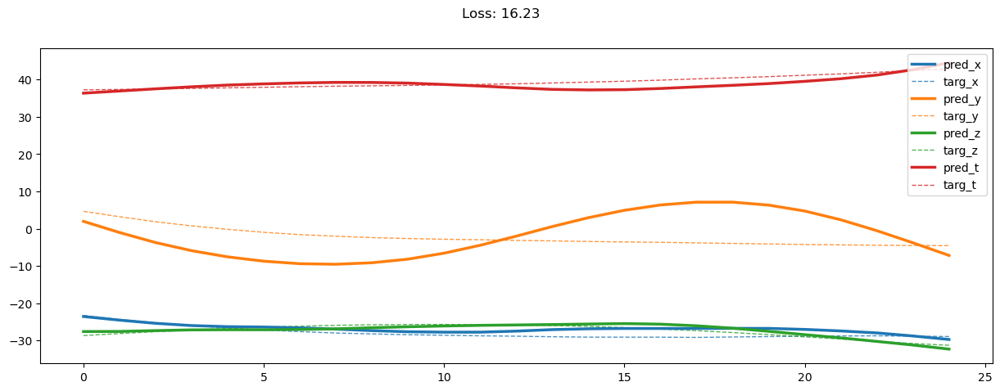

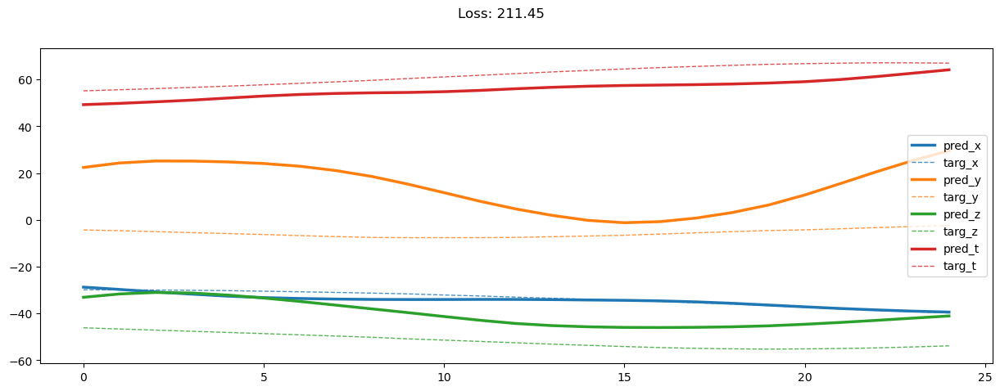

04000: train loss:  162.392, imu loss:  0.124, mag loss:  55.253, div loss:  102.302, slim:  4.107, tlim:  4.915
       valid loss:  224.764, imu loss:  0.093, mag loss:  109.908, div loss:  109.526, slim:  3.754, tlim:  5.731
04020: train loss:  161.046, imu loss:  0.123, mag loss:  55.072, div loss:  101.171, slim:  4.092, tlim:  4.878
       valid loss:  229.535, imu loss:  0.093, mag loss:  112.641, div loss:  111.593, slim:  3.688, tlim:  5.715
04040: train loss:  161.244, imu loss:  0.123, mag loss:  55.041, div loss:  101.426, slim:  4.009, tlim:  4.869
       valid loss:  228.560, imu loss:  0.093, mag loss:  112.611, div loss:  110.599, slim:  3.692, tlim:  5.779
04060: train loss:  161.758, imu loss:  0.123, mag loss:  55.226, div loss:  101.711, slim:  4.099, tlim:  4.897
       valid loss:  226.139, imu loss:  0.093, mag loss:  110.758, div loss:  110.141, slim:  3.665, tlim:  5.641
04080: train loss:  161.622, imu loss:  0.123, mag loss:  55.287, div loss:  101.485, slim: 

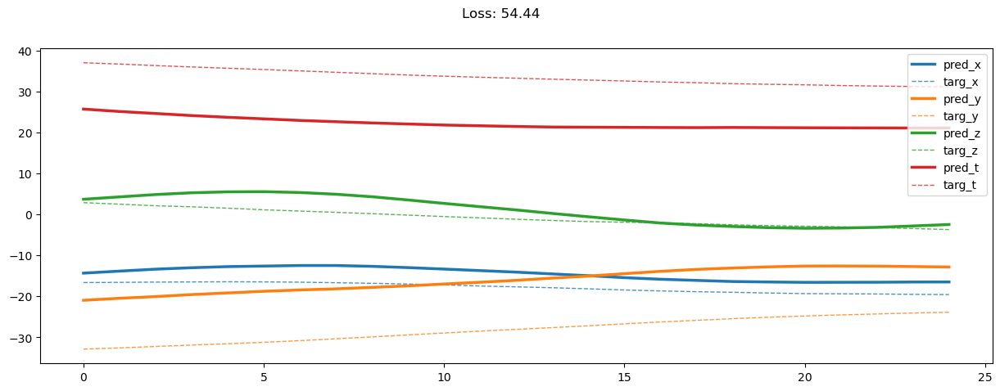

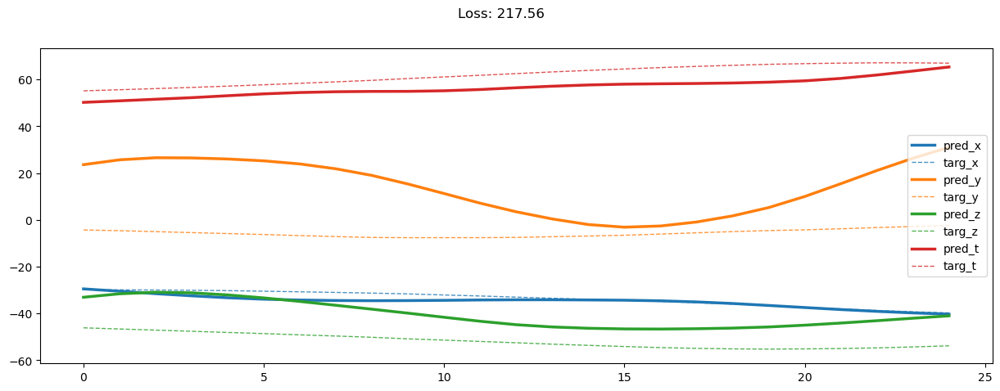

04200: train loss:  160.300, imu loss:  0.123, mag loss:  54.585, div loss:  100.913, slim:  4.078, tlim:  4.879
       valid loss:  227.146, imu loss:  0.093, mag loss:  110.757, div loss:  111.077, slim:  3.717, tlim:  5.720
04220: train loss:  159.457, imu loss:  0.123, mag loss:  54.593, div loss:  100.065, slim:  4.066, tlim:  4.880
       valid loss:  225.692, imu loss:  0.093, mag loss:  110.569, div loss:  109.882, slim:  3.538, tlim:  5.685
04240: train loss:  160.932, imu loss:  0.123, mag loss:  54.874, div loss:  101.210, slim:  4.157, tlim:  4.914
       valid loss:  222.462, imu loss:  0.093, mag loss:  108.606, div loss:  108.558, slim:  3.642, tlim:  5.725
04260: train loss:  160.755, imu loss:  0.124, mag loss:  54.946, div loss:  100.984, slim:  4.126, tlim:  4.892
       valid loss:  228.370, imu loss:  0.093, mag loss:  111.252, div loss:  111.800, slim:  3.714, tlim:  5.728
04280: train loss:  159.056, imu loss:  0.123, mag loss:  54.309, div loss:  99.970, slim:  

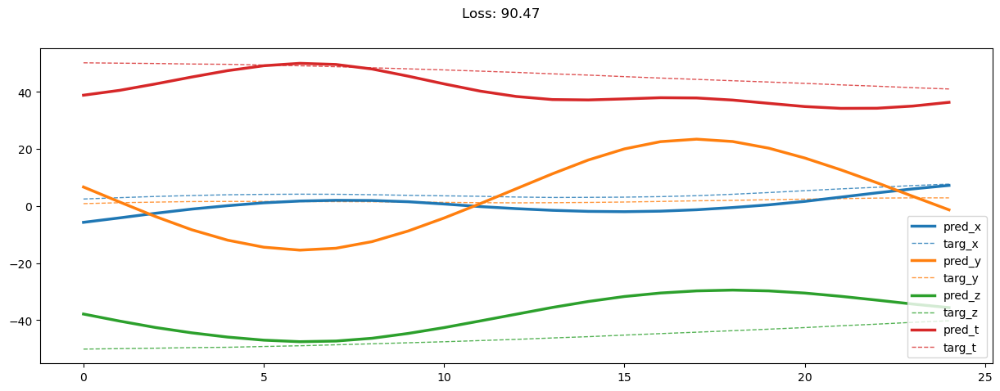

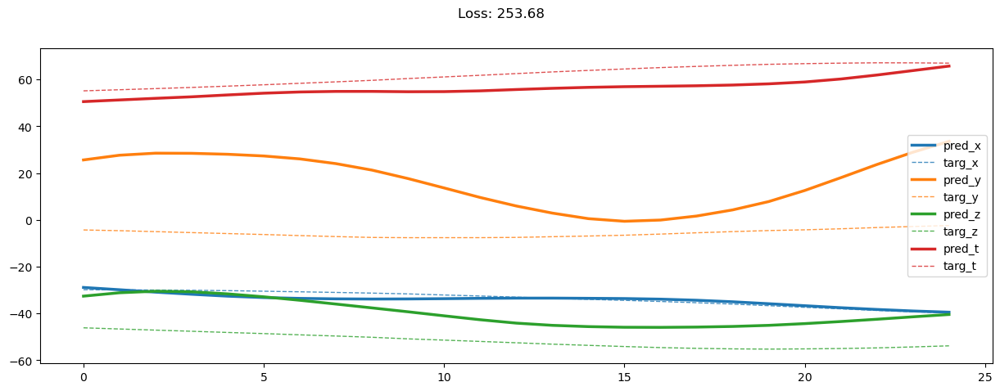

04400: train loss:  159.433, imu loss:  0.123, mag loss:  54.345, div loss:  100.251, slim:  4.127, tlim:  4.910
       valid loss:  230.294, imu loss:  0.093, mag loss:  113.526, div loss:  111.445, slim:  3.729, tlim:  5.730
04420: train loss:  159.624, imu loss:  0.123, mag loss:  54.301, div loss:  100.593, slim:  4.030, tlim:  4.799
       valid loss:  226.536, imu loss:  0.093, mag loss:  111.600, div loss:  109.675, slim:  3.552, tlim:  5.706
04440: train loss:  158.416, imu loss:  0.123, mag loss:  53.990, div loss:  99.665, slim:  4.026, tlim:  4.842
       valid loss:  222.857, imu loss:  0.093, mag loss:  107.827, div loss:  109.831, slim:  3.581, tlim:  5.614
04460: train loss:  159.577, imu loss:  0.123, mag loss:  54.466, div loss:  100.313, slim:  4.067, tlim:  4.877
       valid loss:  226.526, imu loss:  0.093, mag loss:  109.589, div loss:  111.653, slim:  3.685, tlim:  5.693
04480: train loss:  158.182, imu loss:  0.123, mag loss:  54.295, div loss:  99.099, slim:  4

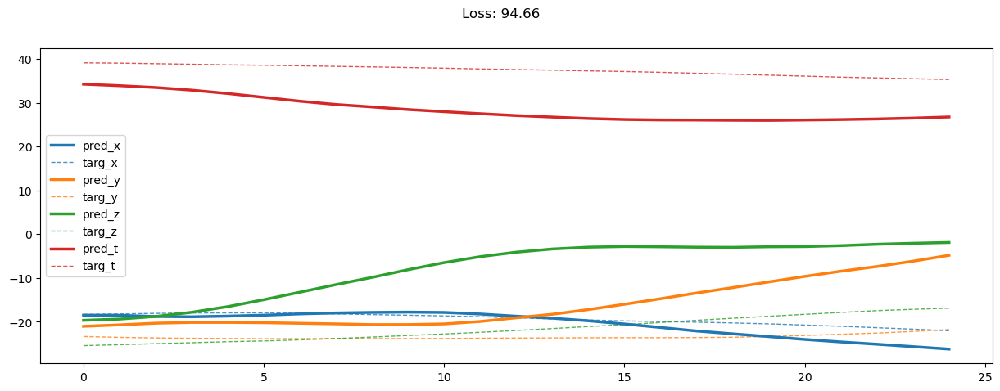

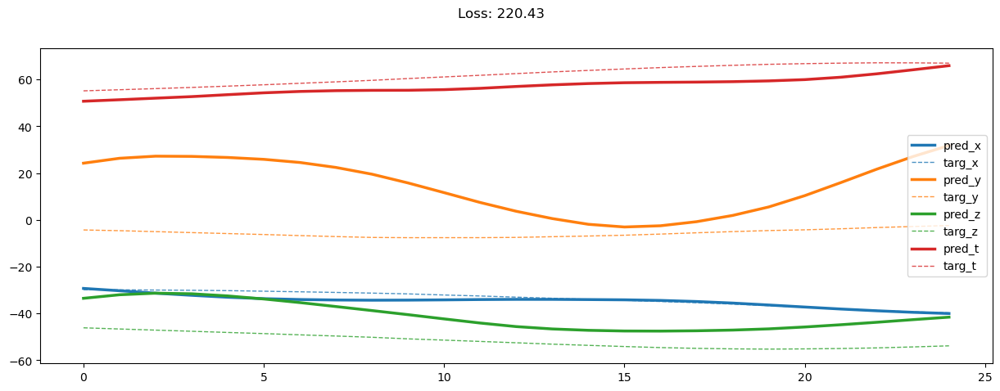

04600: train loss:  158.912, imu loss:  0.123, mag loss:  53.901, div loss:  100.238, slim:  4.049, tlim:  4.850
       valid loss:  224.678, imu loss:  0.093, mag loss:  110.271, div loss:  109.149, slim:  3.664, tlim:  5.665
04620: train loss:  158.102, imu loss:  0.123, mag loss:  53.657, div loss:  99.675, slim:  4.064, tlim:  4.840
       valid loss:  223.491, imu loss:  0.093, mag loss:  108.196, div loss:  109.960, slim:  3.817, tlim:  5.717
04640: train loss:  158.078, imu loss:  0.123, mag loss:  53.927, div loss:  99.365, slim:  4.094, tlim:  4.853
       valid loss:  228.141, imu loss:  0.093, mag loss:  111.244, div loss:  111.610, slim:  3.628, tlim:  5.716
04660: train loss:  158.709, imu loss:  0.123, mag loss:  54.085, div loss:  99.829, slim:  4.112, tlim:  4.859
       valid loss:  223.903, imu loss:  0.093, mag loss:  109.411, div loss:  109.266, slim:  3.555, tlim:  5.660
04680: train loss:  156.530, imu loss:  0.123, mag loss:  53.731, div loss:  97.972, slim:  4.1

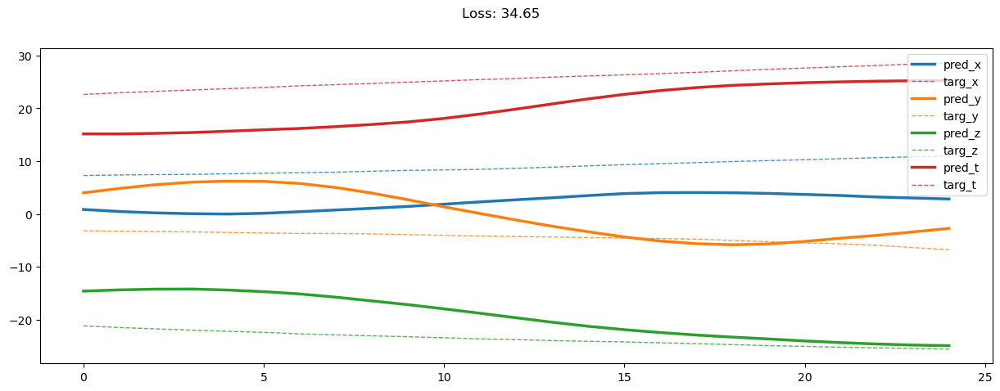

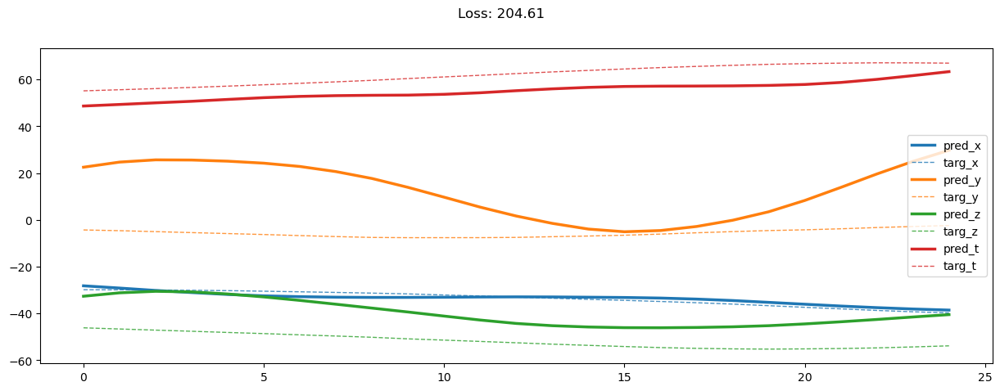

04800: train loss:  157.396, imu loss:  0.124, mag loss:  53.652, div loss:  98.992, slim:  4.064, tlim:  4.816
       valid loss:  225.672, imu loss:  0.093, mag loss:  108.719, div loss:  111.775, slim:  3.477, tlim:  5.621
04820: train loss:  156.084, imu loss:  0.123, mag loss:  53.343, div loss:  97.943, slim:  4.113, tlim:  4.861
       valid loss:  228.457, imu loss:  0.093, mag loss:  111.735, div loss:  111.457, slim:  3.571, tlim:  5.706
04840: train loss:  155.747, imu loss:  0.123, mag loss:  53.469, div loss:  97.532, slim:  4.038, tlim:  4.818
       valid loss:  229.054, imu loss:  0.093, mag loss:  111.884, div loss:  111.802, slim:  3.864, tlim:  5.744
04860: train loss:  156.393, imu loss:  0.122, mag loss:  53.459, div loss:  98.177, slim:  4.059, tlim:  4.826
       valid loss:  224.667, imu loss:  0.093, mag loss:  109.572, div loss:  109.831, slim:  3.616, tlim:  5.689
04880: train loss:  155.739, imu loss:  0.123, mag loss:  53.225, div loss:  97.740, slim:  4.09

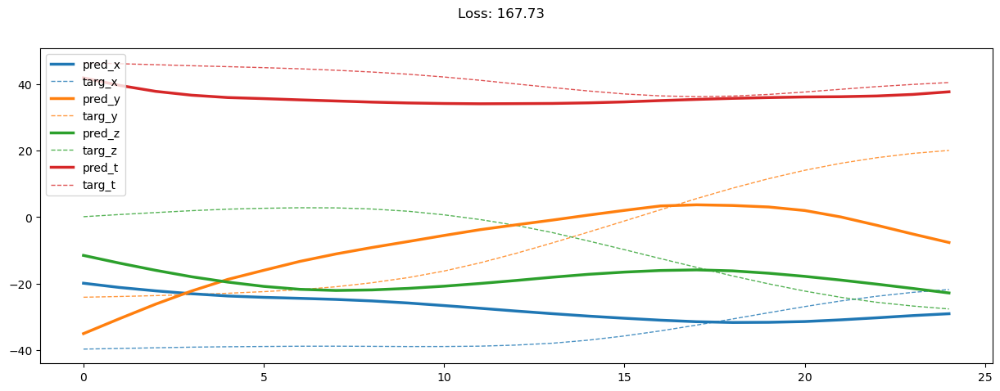

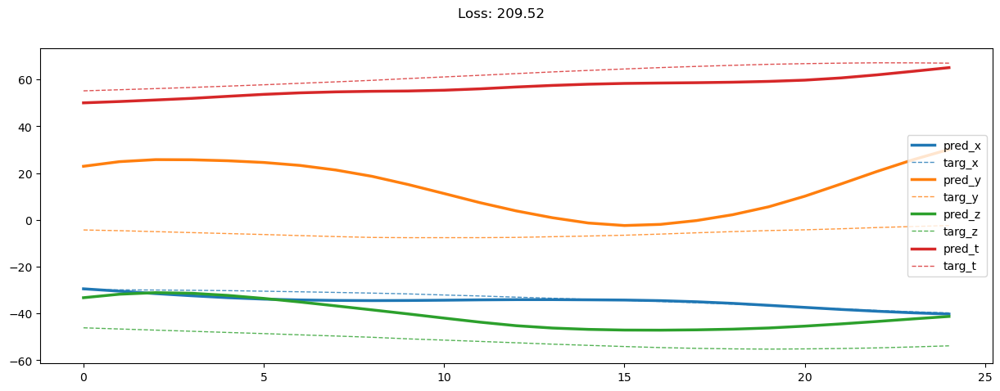

05000: train loss:  155.570, imu loss:  0.123, mag loss:  53.063, div loss:  97.744, slim:  4.083, tlim:  4.825
       valid loss:  226.802, imu loss:  0.093, mag loss:  110.977, div loss:  110.522, slim:  3.579, tlim:  5.753
05020: train loss:  155.437, imu loss:  0.123, mag loss:  53.028, div loss:  97.604, slim:  4.126, tlim:  4.868
       valid loss:  222.706, imu loss:  0.093, mag loss:  107.521, div loss:  109.876, slim:  3.671, tlim:  5.730
05040: train loss:  156.424, imu loss:  0.123, mag loss:  52.951, div loss:  98.755, slim:  4.000, tlim:  4.793
       valid loss:  227.682, imu loss:  0.093, mag loss:  110.882, div loss:  111.484, slim:  3.663, tlim:  5.743
05060: train loss:  155.500, imu loss:  0.123, mag loss:  52.804, div loss:  97.962, slim:  4.062, tlim:  4.794
       valid loss:  226.531, imu loss:  0.093, mag loss:  110.932, div loss:  110.310, slim:  3.625, tlim:  5.718
05080: train loss:  156.492, imu loss:  0.123, mag loss:  53.277, div loss:  98.393, slim:  4.18

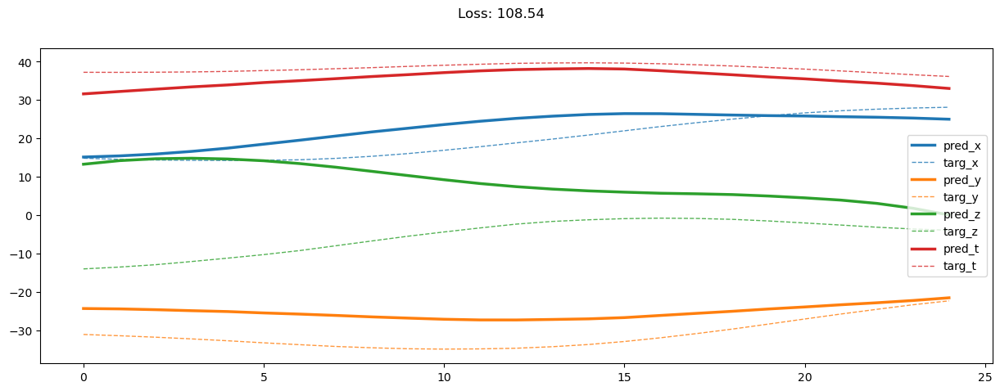

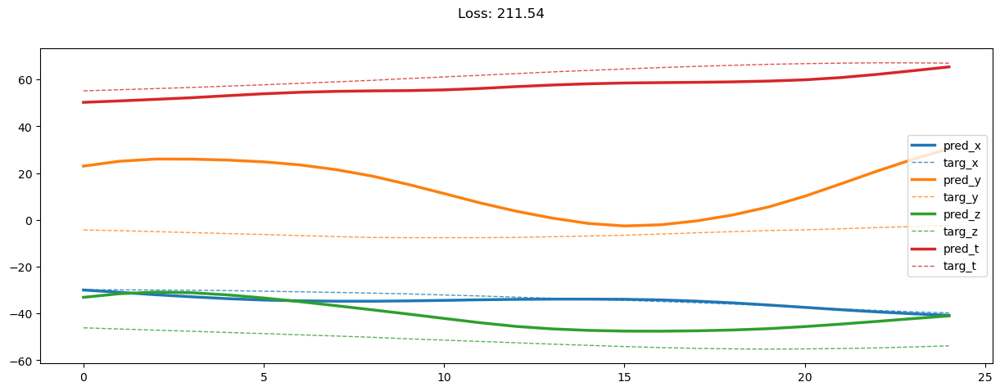

05200: train loss:  153.488, imu loss:  0.123, mag loss:  52.289, div loss:  96.481, slim:  4.032, tlim:  4.782
       valid loss:  228.574, imu loss:  0.093, mag loss:  111.258, div loss:  111.982, slim:  3.743, tlim:  5.740
05220: train loss:  154.365, imu loss:  0.123, mag loss:  52.404, div loss:  97.237, slim:  4.053, tlim:  4.784
       valid loss:  220.785, imu loss:  0.094, mag loss:  107.028, div loss:  108.495, slim:  3.564, tlim:  5.704
05240: train loss:  152.597, imu loss:  0.123, mag loss:  52.310, div loss:  95.525, slim:  4.107, tlim:  4.816
       valid loss:  228.408, imu loss:  0.094, mag loss:  111.100, div loss:  111.920, slim:  3.889, tlim:  5.764
05260: train loss:  153.653, imu loss:  0.123, mag loss:  52.316, div loss:  96.563, slim:  4.096, tlim:  4.836
       valid loss:  224.652, imu loss:  0.094, mag loss:  108.208, div loss:  111.208, slim:  3.621, tlim:  5.649
05280: train loss:  153.837, imu loss:  0.123, mag loss:  52.344, div loss:  96.758, slim:  4.09

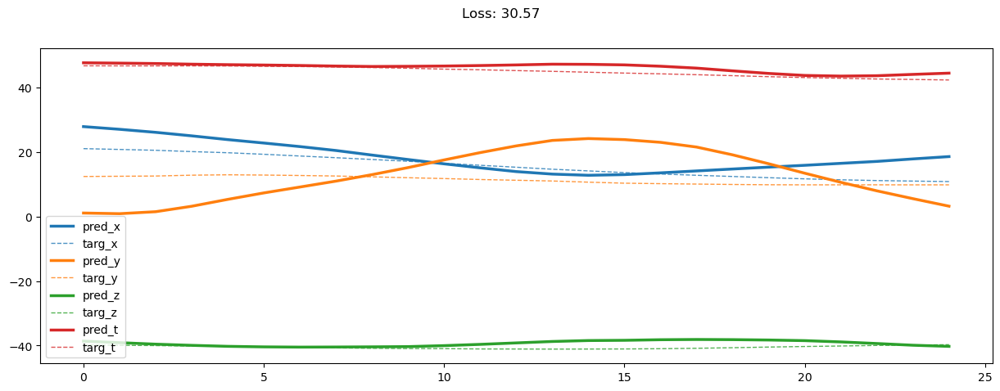

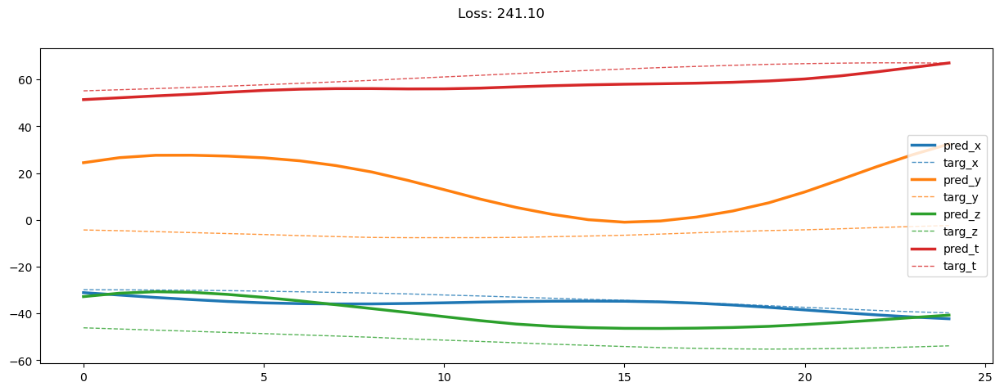

05400: train loss:  153.558, imu loss:  0.122, mag loss:  52.410, div loss:  96.410, slim:  4.097, tlim:  4.788
       valid loss:  228.831, imu loss:  0.094, mag loss:  111.726, div loss:  111.665, slim:  3.948, tlim:  5.813
05420: train loss:  153.609, imu loss:  0.124, mag loss:  52.235, div loss:  96.609, slim:  4.139, tlim:  4.808
       valid loss:  225.034, imu loss:  0.093, mag loss:  109.358, div loss:  110.351, slim:  3.667, tlim:  5.754
05440: train loss:  151.618, imu loss:  0.123, mag loss:  51.711, div loss:  95.233, slim:  4.021, tlim:  4.727
       valid loss:  231.052, imu loss:  0.094, mag loss:  112.796, div loss:  112.981, slim:  3.646, tlim:  5.694
05460: train loss:  151.885, imu loss:  0.122, mag loss:  51.782, div loss:  95.325, slim:  4.136, tlim:  4.827
       valid loss:  227.051, imu loss:  0.093, mag loss:  111.051, div loss:  110.719, slim:  3.666, tlim:  5.695
05480: train loss:  151.803, imu loss:  0.123, mag loss:  51.998, div loss:  95.043, slim:  4.10

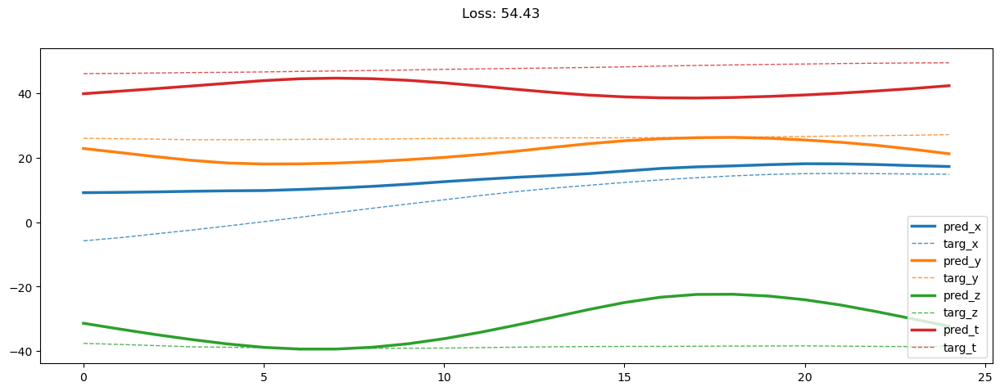

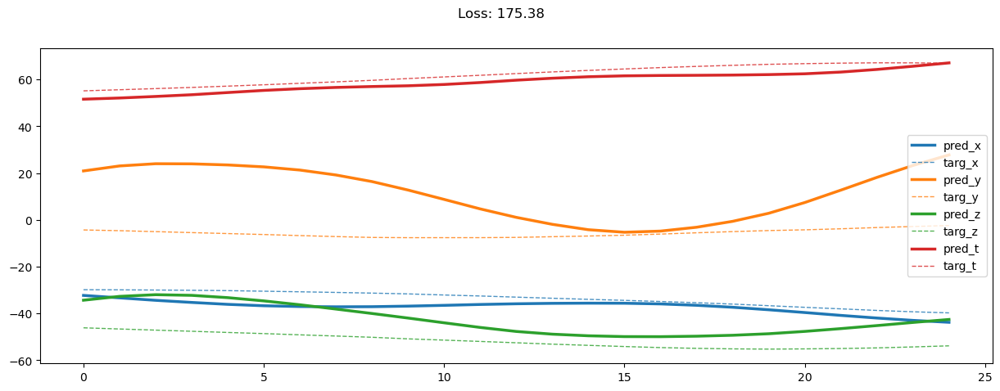

05600: train loss:  150.834, imu loss:  0.124, mag loss:  51.505, div loss:  94.648, slim:  4.058, tlim:  4.724
       valid loss:  234.377, imu loss:  0.094, mag loss:  114.187, div loss:  114.707, slim:  3.881, tlim:  5.892
05620: train loss:  150.502, imu loss:  0.123, mag loss:  51.364, div loss:  94.437, slim:  4.065, tlim:  4.750
       valid loss:  231.580, imu loss:  0.094, mag loss:  112.253, div loss:  113.896, slim:  3.832, tlim:  5.839
05640: train loss:  151.203, imu loss:  0.124, mag loss:  51.464, div loss:  95.010, slim:  4.090, tlim:  4.776
       valid loss:  227.774, imu loss:  0.094, mag loss:  109.904, div loss:  112.530, slim:  3.729, tlim:  5.752
05660: train loss:  150.559, imu loss:  0.123, mag loss:  51.255, div loss:  94.613, slim:  4.072, tlim:  4.733
       valid loss:  234.646, imu loss:  0.094, mag loss:  114.283, div loss:  114.933, slim:  3.767, tlim:  5.859
05680: train loss:  150.687, imu loss:  0.123, mag loss:  51.378, div loss:  94.594, slim:  4.08

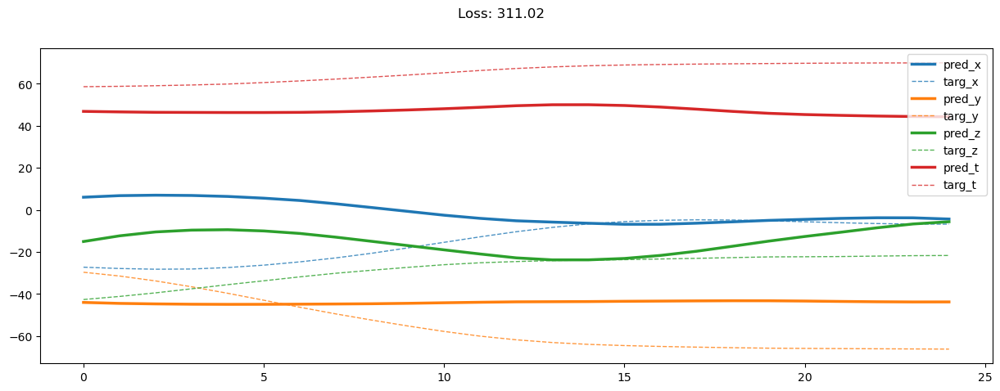

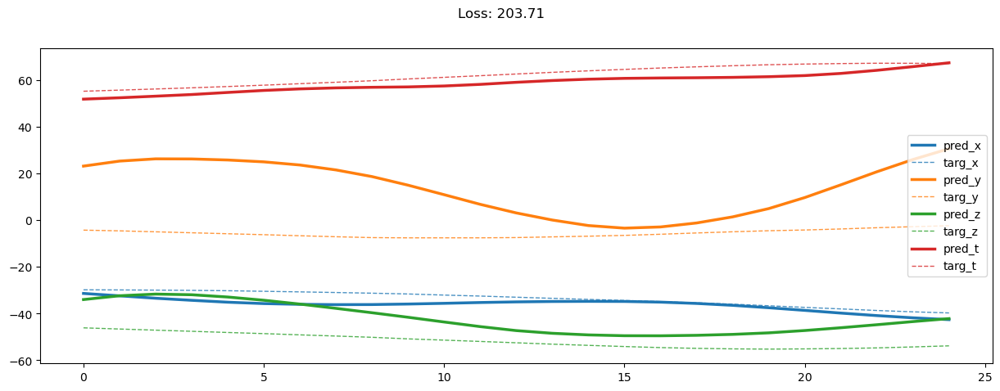

05800: train loss:  150.816, imu loss:  0.123, mag loss:  51.381, div loss:  94.706, slim:  4.128, tlim:  4.766
       valid loss:  231.794, imu loss:  0.094, mag loss:  113.017, div loss:  113.355, slim:  3.881, tlim:  5.810
05820: train loss:  150.374, imu loss:  0.123, mag loss:  51.238, div loss:  94.431, slim:  4.077, tlim:  4.750
       valid loss:  231.729, imu loss:  0.094, mag loss:  112.949, div loss:  113.310, slim:  3.888, tlim:  5.873
05840: train loss:  149.211, imu loss:  0.123, mag loss:  50.760, div loss:  93.779, slim:  4.029, tlim:  4.722
       valid loss:  233.117, imu loss:  0.094, mag loss:  113.382, div loss:  114.356, slim:  3.713, tlim:  5.808
05860: train loss:  151.019, imu loss:  0.123, mag loss:  51.243, div loss:  95.076, slim:  4.075, tlim:  4.745
       valid loss:  225.439, imu loss:  0.093, mag loss:  109.119, div loss:  110.958, slim:  3.838, tlim:  5.744
05880: train loss:  150.047, imu loss:  0.123, mag loss:  50.849, div loss:  94.541, slim:  4.02

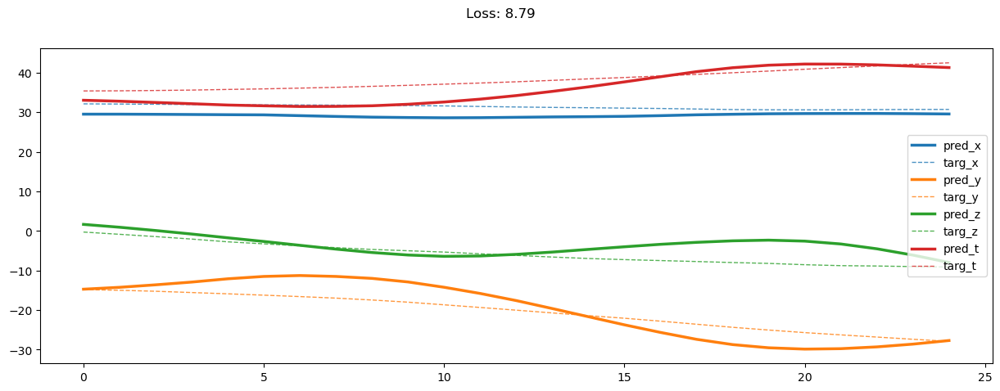

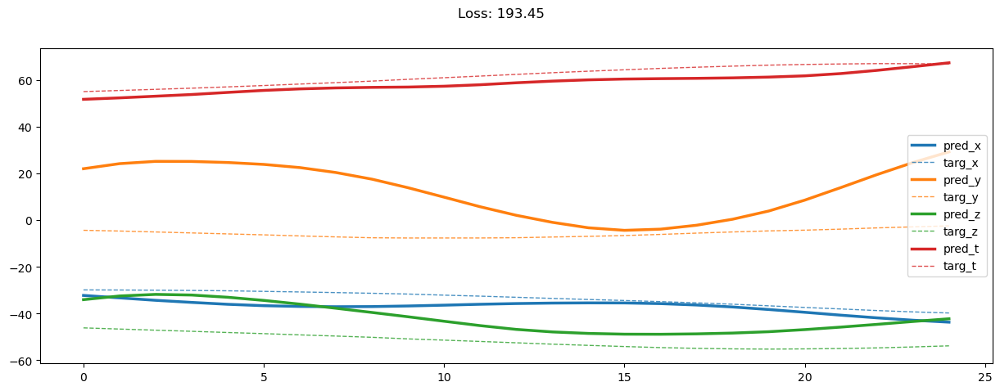

06000: train loss:  148.876, imu loss:  0.123, mag loss:  50.772, div loss:  93.427, slim:  4.055, tlim:  4.720
       valid loss:  232.051, imu loss:  0.094, mag loss:  111.623, div loss:  114.972, slim:  3.886, tlim:  5.854


In [44]:
draw = True

for epoch in range(EPOCH):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    if (epoch + 1) % 200 == 0:
        draw = True
    
    train_loss, train_imu_loss, train_mag_loss, t_d1_loss, tlim_loss = train(train_loader, draw)
    valid_loss, valid_imu_loss, valid_mag_loss, v_d1_loss, vlim_loss = evalute(valid_loader, draw)
    
    draw = False
    
    if (epoch + 1) % 20 == 0:
        ep = str(epoch + 1).zfill(5)
        print(f'{ep:>5}: train loss: {train_loss: 2.3f}, imu loss: {train_imu_loss: 2.3f}, mag loss: {train_mag_loss: 2.3f}, div loss: {t_d1_loss: 2.3f}, slim: {tlim_loss[0]: 2.3f}, tlim: {tlim_loss[1]: 2.3f}\n' +
              f'{"":>5}  valid loss: {valid_loss: 2.3f}, imu loss: {valid_imu_loss: 2.3f}, mag loss: {valid_mag_loss: 2.3f}, div loss: {v_d1_loss: 2.3f}, slim: {vlim_loss[0]: 2.3f}, tlim: {vlim_loss[1]: 2.3f}')

In [49]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    class_results = []
    class_labels = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :6]
            source_mag = source_data[:, :, 7:10]
            source_total_mag = source_data[:, :, 10]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :6]
            target_mag = target_data[:, :, 7:10]
            target_total_mag = target_data[:, :, 10]

            # generate mag
            source_class = classifier.predict_label(source_imu)
            z_imu, predict_mag = model(source_imu, source_mag, source_class)


            # generator loss
#             gen_loss, imu_loss, mag_loss = generator_loss(z_imu, target_imu, predict_mag, target_mag)

            # record loss
            predict_mag = predict_mag.detach().cpu().numpy()
            target_mag = target_mag.cpu().numpy()
            source_label = source_label.detach().cpu().numpy()
            
            results.extend(zip(predict_mag, target_mag, source_label))
            
            diff = np.power(predict_mag.reshape(len(predict_mag), -1, 3) - target_mag.reshape(len(target_mag), -1, 3), 2).mean(axis=1)
            class_results.extend(diff)
            class_labels.extend(source_label)
    
    return np.array(results, dtype=object), np.array(class_results), np.array(class_labels)

In [38]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    source_label = result[2]
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'{classes[source_label]}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

(8973, 3) (8973,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    36.04    26.29    26.19    29.51
         pocket loss:    61.24    78.94    58.34    66.17
          swing loss:    67.83   106.49   112.84    95.72
        average loss:    54.75    69.83    64.95    63.18


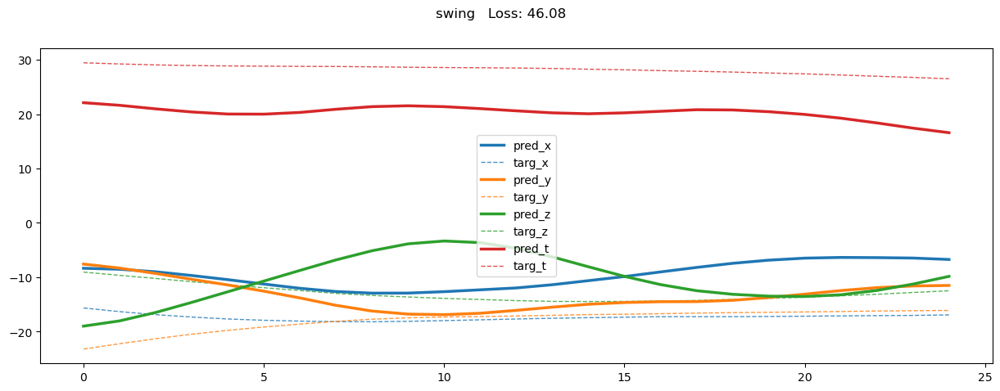

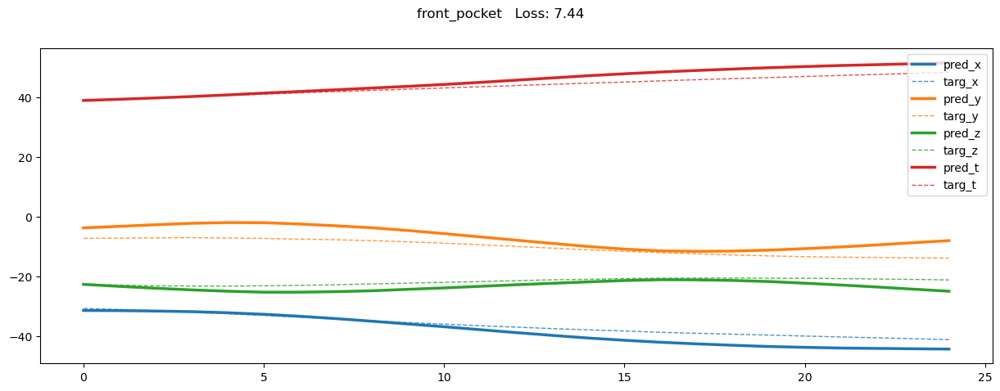

In [39]:
results, cres, clabel = output_eval(model, train_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"diff z":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dx, dy, dz = cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
dx, dy, dz = cres.mean(axis=0)
print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')

for rs in results[::5000]:
    plot_result(rs)

(1273, 3) (1273,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    37.02    43.60    33.61    38.08
         pocket loss:    80.75   156.38    82.17   106.43
          swing loss:    80.69   222.33   155.27   152.76
        average loss:    64.86   137.00    88.44    96.76


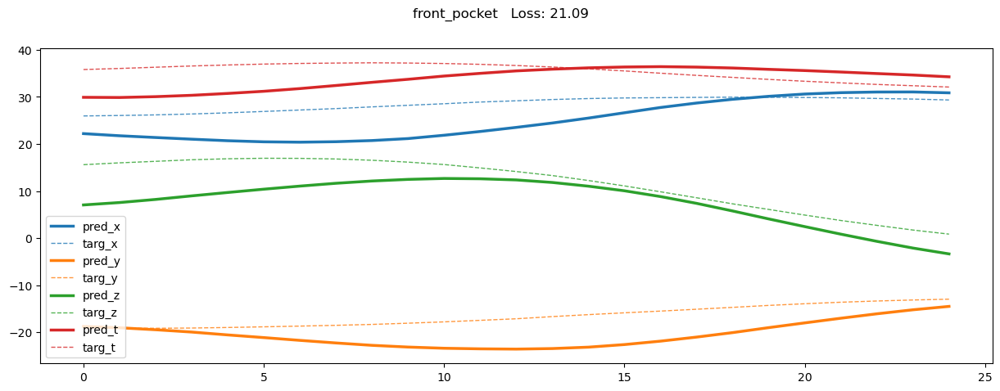

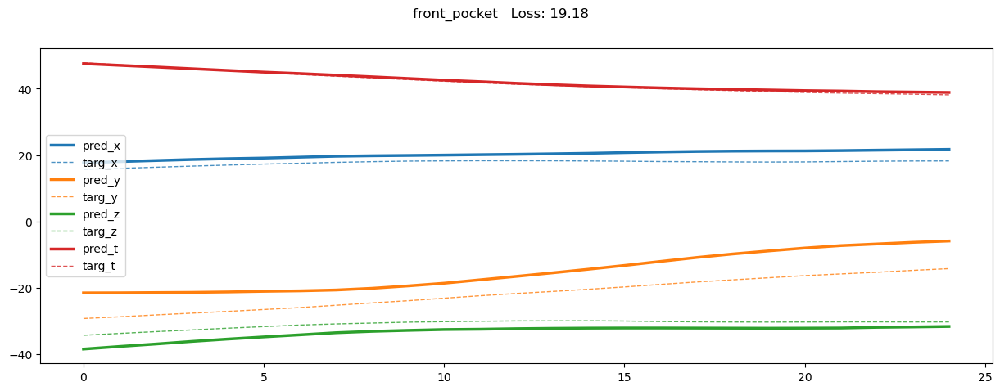

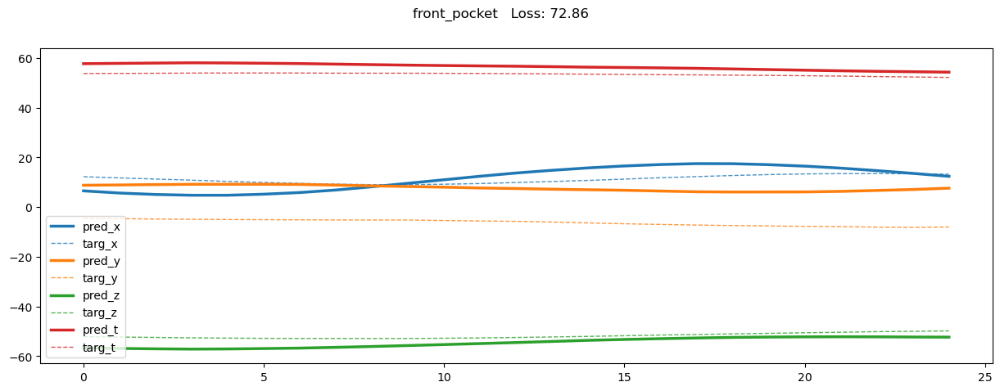

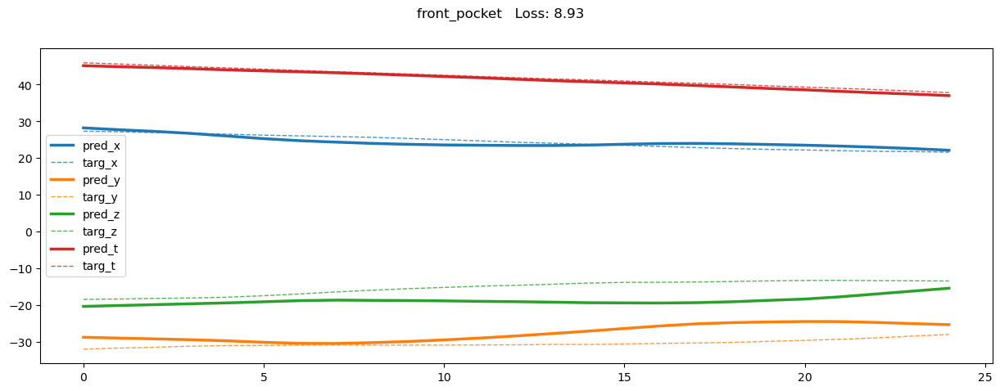

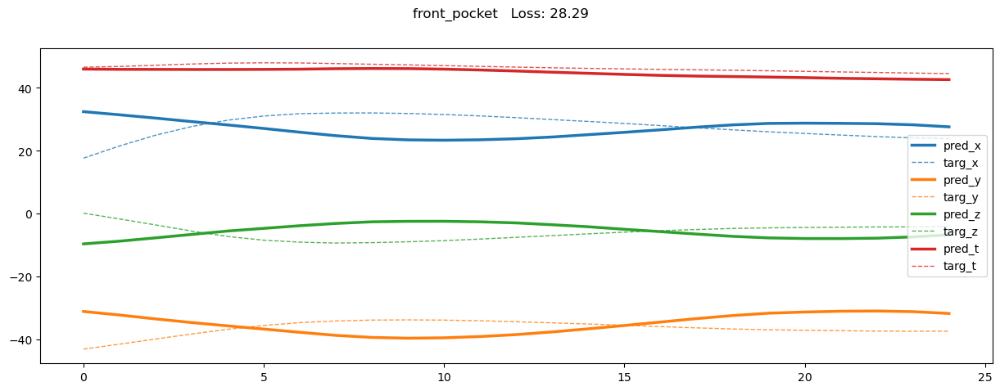

...

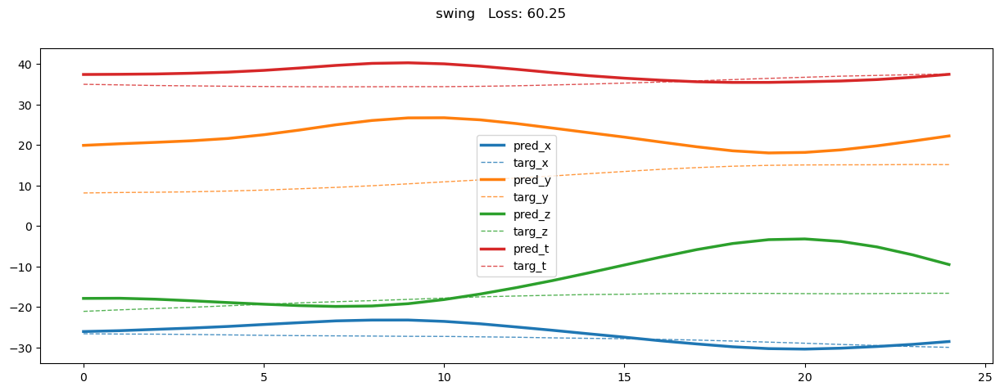

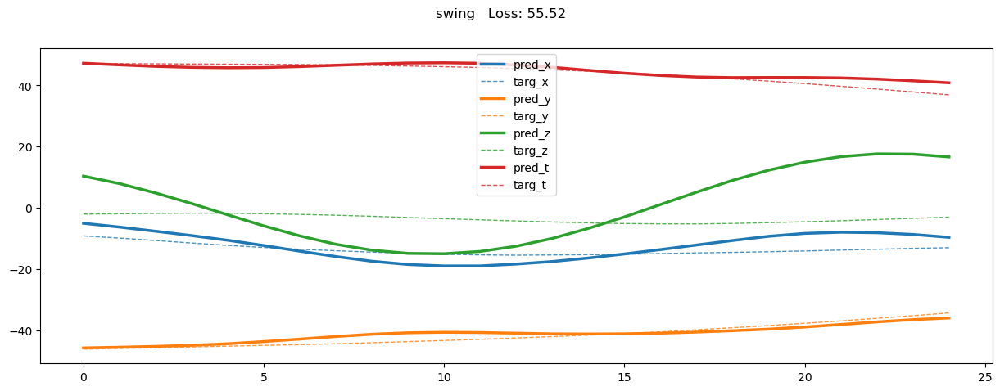

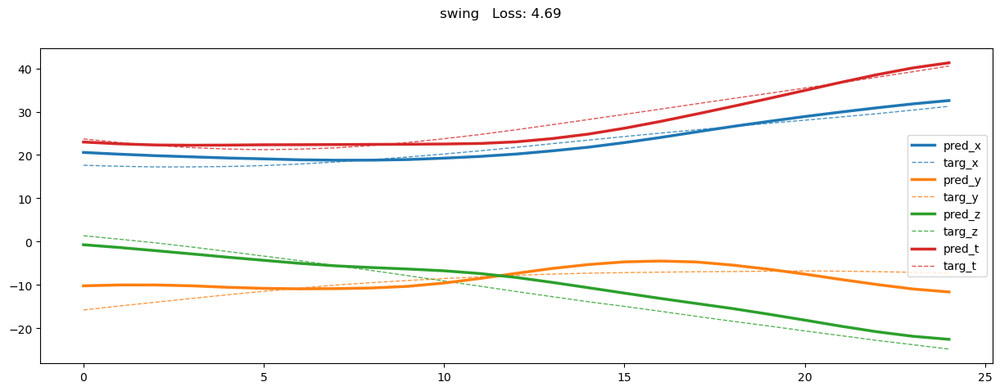

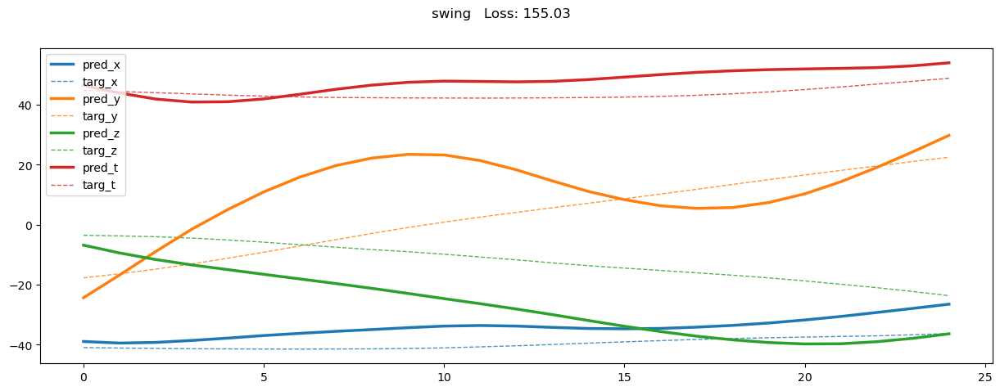

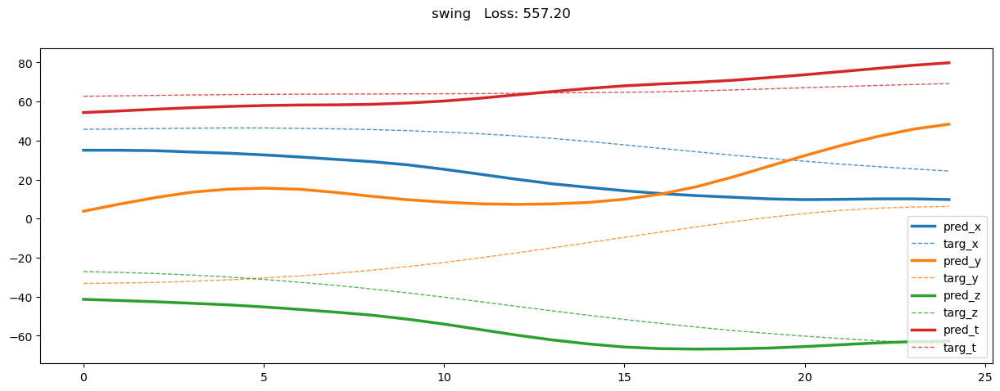

In [40]:
results, cres, clabel = output_eval(model, valid_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"diff z":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dx, dy, dz = cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
dx, dy, dz = cres.mean(axis=0)
print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')

for rs in results[::50]:
    plot_result(rs)

In [46]:
def plot_eval_result(result, path):
    pred_mag = np.stack(results[:, 0], axis=0)[:, 0].reshape(-1, 3)
    targ_mag = np.stack(results[:, 1], axis=0)[:, 0].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(25, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'{path}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [47]:
def load_data(folder_path):
    source_path = os.path.join(folder_path, 'source')
    target_path = os.path.join(folder_path, 'target')

    #########################
    ##### check devices #####
    #########################
    source_path, target_path = check_data_device(source_path, target_path)

    ####################################
    ##### load and preprocess data #####
    ####################################
    source_df = load_original_data(source_path)
    target_df = load_original_data(target_path)

    source_df, target_df = bound_range(source_df), bound_range(target_df)
    source_df, target_df = align_data(source_df, target_df)
    
    return select_data(source_df), select_data(target_df)

def split_data(df):
    ncols = seq_len
    nrows = len(df) - seq_len + 1
    
    index = np.zeros((nrows, ncols), dtype=int)
    index += np.arange(ncols)
    index += np.arange(nrows).T[:, None]
    
    return df.to_numpy()[index]    

def combine_to_dataloader(source, target):
    dataset = PairDataset(
                        source_data = torch.tensor(source, dtype=torch.float),
                        source_label = np.zeros(len(source)),
                        target_data = torch.tensor(target, dtype=torch.float),
                        target_label = np.zeros(len(target)),
                    )
    dataloader = DataLoader(dataset, batch_size=512, shuffle=False)
    
    return dataloader

def generate_dataloader(folder_path):
    source_df, target_df = load_data(folder_path)
    source_segs, target_segs = split_data(source_df), split_data(target_df)

    return combine_to_dataloader(source_segs, target_segs)

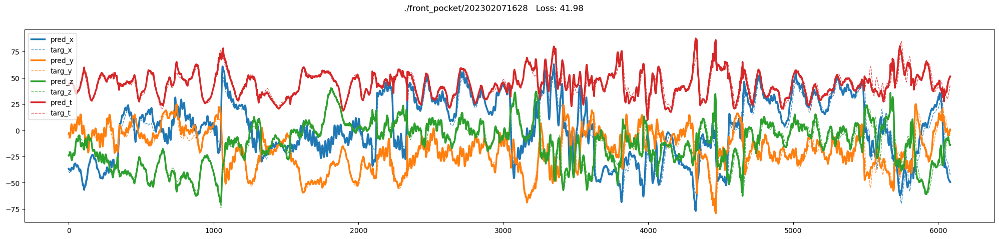

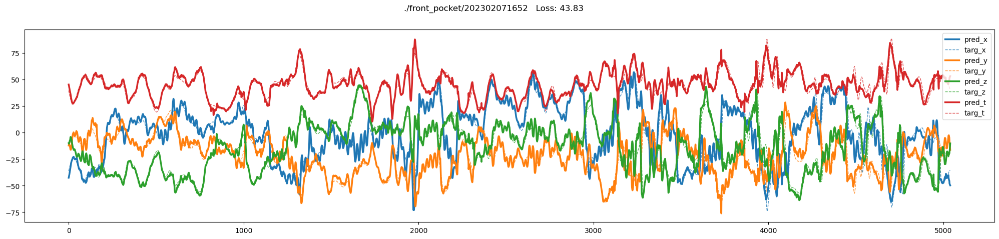

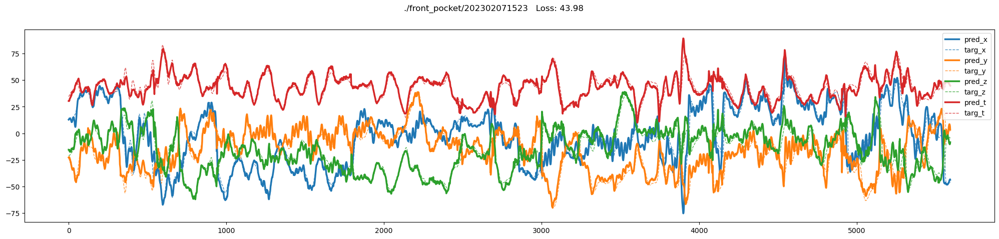

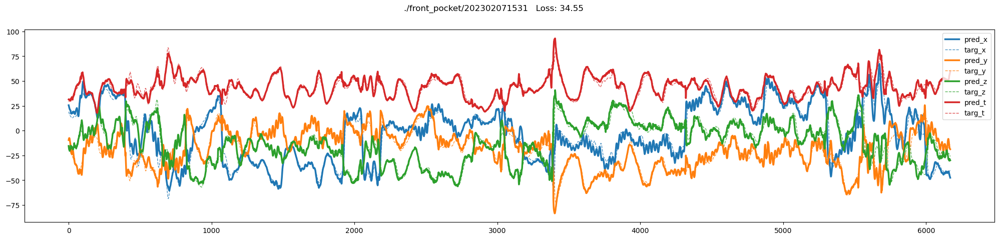

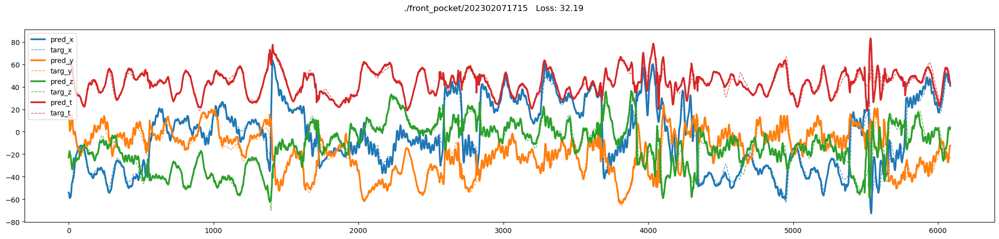

...

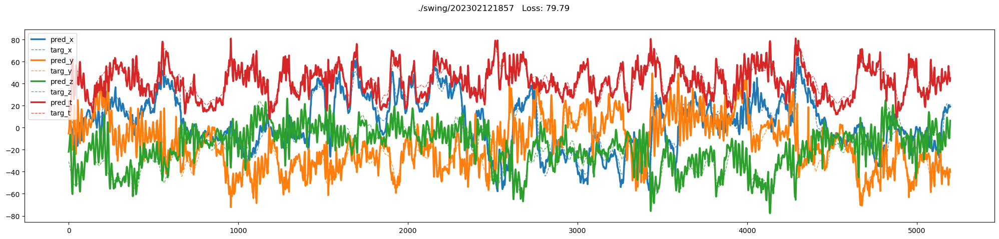

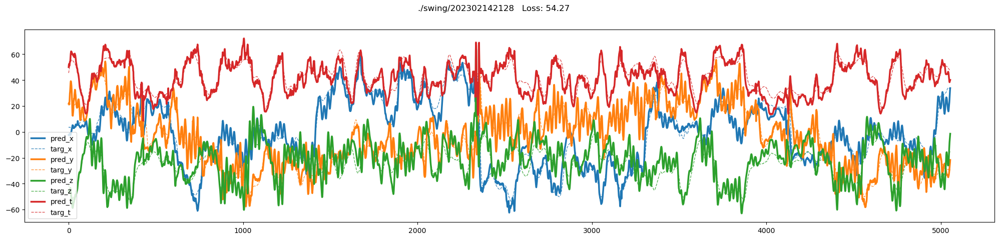

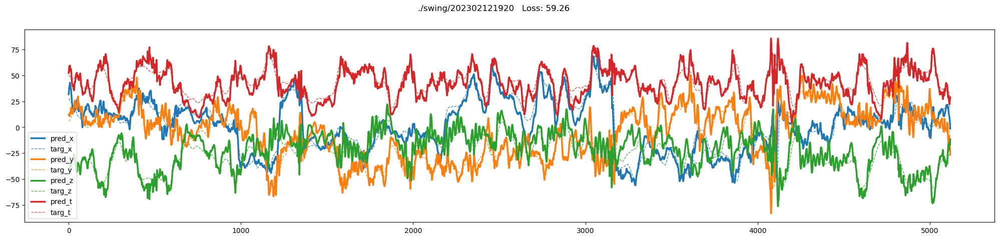

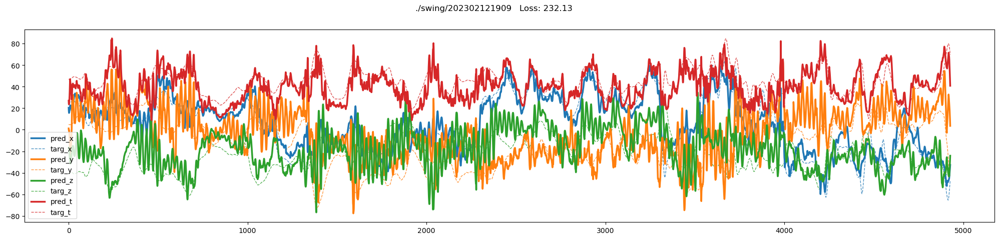

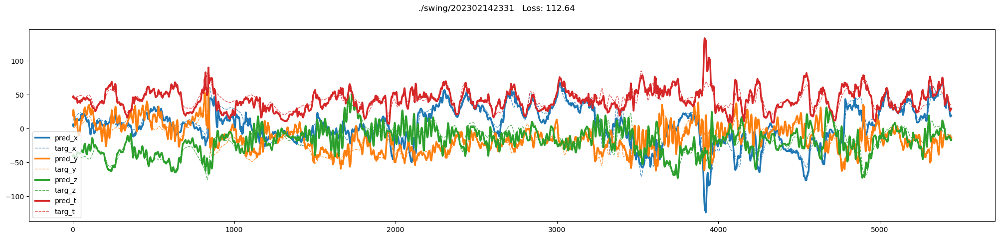

In [50]:
for folder in ['./front_pocket/*', './pocket/*', './swing/*']:
    for path in glob.glob(folder):
        eval_loader = generate_dataloader(path)
        results, _, _ = output_eval(model, eval_loader)
        plot_eval_result(results, path)